# Restaurant Sentiment Analysis Around COVID-19: How has sentiment changed in response to a rapid change in buisness strategy?

## Contents
1. **[Data Import and Cleaning](#Data-Import-and-Cleaning)**  
    ***1a. [Functions](#Functions)***  
    ***1b. [Distribution of Restaurants](#Distribution-of-Restaurants)***  
2. **[Sentiment Analysis](#Sentiment-Analysis)**  
    ***2a. [Data Preparation for Sentiment Analysis](#Data-Preparation-for-Sentiment-Analysis)***  
    ***2b. [Overall Sentiment](#Overall-Sentiment)***  
    _Subtopics: [VADER Scores](#VADER-Scores-Explained), [VADER Scores v. Review Stars](#Relationship-of-VADER-Scores-and-Review-Stars), [Overall Sentiment by Region](#Overall-Sentiment-by-Region)_    
    ***2c. [Sentiment Pre- and Post-Lockdown](#Sentiment-Pre--and-Post-Lockdown)***  
    _Subtopics: [Review Stars](#Review-Stars), [Compound VADER Scores](#Compound-VADER-Scores), [Positive VADER Scores](#Positive-VADER-Scores), [Negative VADER Scores](#Negative-VADER-Scores)_  
    ***2d. [Sentiment Pre- and Post-Lockdown by Region](#Sentiment-Pre--and-Post-Lockdown-by-Region)***  
    _Subtopics: [Review Stars by Region](#Review-Stars-by-Region), [Compound Scores by Region](#Compound-VADER-Scores-by-Region), [Positive Scores by Region](#Positive-VADER-Scores-by-Region), [Negative Scores by Region](#Negative-VADER-Scores-by-Region)_  
    ***2e. [Sentiment Analysis Conclusions](#Sentiment-Analysis-Conclusions)***
3. **[Modeling of Reviews](#Modeling-of-Reviews)**  
    ***3a. [Additional Data Cleaning](#Additional-Data-Cleaning)***  
    ***3b. [TF-IDF Modeling](#TF-IDF-Modeling)***  
    ***3c. [KMeans Clustering](#KMeans-Clustering)***  
    ***3d. [PCA](#Principal-Component-Analysis)***  
    ***3e. [Topic Modeling](#Topic-Modeling)***  
    ***3f. [Coronavirus-Like Review Sentiment](#Coronavirus-Like-Review-Sentiment)***  
    _Subtopics: [Sentiment of the Coronavirus Cluster](#Sentiment-of-the-Coronavirus-Cluster), [Comparison of Sentiment by Cluster](#Comparison-of-Sentiment-by-Cluster), [Sample Reviews for the Coronavirus-Like Cluster](#Sample-Reviews-for-the-Coronavirus-Like-Cluster), [Geographical Distribution of Coronavirus-Like Reviews](#Geographical-Distribution-of-Coronavirus-Like-Reviews)_  
    ***3g. [Modeling Conclusions](#Modeling-Conclusions)***

In [1]:
import pandas as pd
import numpy as np
import itertools as it
import re
from tqdm.notebook import tqdm
import warnings; warnings.filterwarnings('ignore')

# visualization tools
import seaborn as sns
import matplotlib.pyplot as plt
import plotly as py 
import plotly.graph_objs as go
from plotly.offline import iplot
from wordcloud import WordCloud
import random

# nlp and ml tools
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
from spacy.lang.en import English
import string
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

In [2]:
sns.set_context("talk")
sns.set_style('whitegrid', {'xtick.bottom':True, 'ytick.left':True})

***
## Data Import and Cleaning
Data is scraped from Yelp and can be found in a seperate notebook [here](https://github.com/krritz/restaurant-response-to-covid19/blob/master/yelp-scraping.ipynb). Up to 200 restaurants are selected for each of the top 25 counties in the US with the most deaths; per restaurant, up to 100 reviews are scraped.  

&nbsp;&nbsp;a. [Functions](#Functions)  
&nbsp;&nbsp;b. [Distribution of Restaurants](#Distribution-of-Restaurants)  

[Return to Contents](#Contents)

In [3]:
df = pd.read_csv('review_data_2020_04_20_09_04.csv', index_col='Unnamed: 0')
df.head()

,alias,categories,city_x,coordinates,is_closed,location,name,price,rating,review_count,transactions,author,city_y,description,publish_date,review_number,score
--CprxtcUfzKoz29hAzm5w,wellys-restaurant-marlborough,"[{'alias': 'tradamerican', 'title': 'American ...","Middlesex, Massachusetts","{'latitude': 42.3469, 'longitude': -71.54837}",False,"{'address1': '153 Main St', 'address2': '', 'a...",Welly's Restaurant,$$,4.0,170,['delivery'],Sara P.,"Middlesex, Massachusetts",I haven't even left yet. But I am thoroughly p...,2020-01-24,1.0,5.0
--CprxtcUfzKoz29hAzm5w,wellys-restaurant-marlborough,"[{'alias': 'tradamerican', 'title': 'American ...","Middlesex, Massachusetts","{'latitude': 42.3469, 'longitude': -71.54837}",False,"{'address1': '153 Main St', 'address2': '', 'a...",Welly's Restaurant,$$,4.0,170,['delivery'],Matt K.,"Middlesex, Massachusetts",I've been to Welly's a few times and each time...,2019-11-12,2.0,4.0
--CprxtcUfzKoz29hAzm5w,wellys-restaurant-marlborough,"[{'alias': 'tradamerican', 'title': 'American ...","Middlesex, Massachusetts","{'latitude': 42.3469, 'longitude': -71.54837}",False,"{'address1': '153 Main St', 'address2': '', 'a...",Welly's Restaurant,$$,4.0,170,['delivery'],AnnMarie H.,"Middlesex, Massachusetts",Welly's is a very popular bar right in downtow...,2019-11-08,3.0,4.0
--CprxtcUfzKoz29hAzm5w,wellys-restaurant-marlborough,"[{'alias': 'tradamerican', 'title': 'American ...","Middlesex, Massachusetts","{'latitude': 42.3469, 'longitude': -71.54837}",False,"{'address1': '153 Main St', 'address2': '', 'a...",Welly's Restaurant,$$,4.0,170,['delivery'],Christy C.,"Middlesex, Massachusetts",I used to think the idea of fish tacos were no...,2020-04-03,4.0,5.0
--CprxtcUfzKoz29hAzm5w,wellys-restaurant-marlborough,"[{'alias': 'tradamerican', 'title': 'American ...","Middlesex, Massachusetts","{'latitude': 42.3469, 'longitude': -71.54837}",False,"{'address1': '153 Main St', 'address2': '', 'a...",Welly's Restaurant,$$,4.0,170,['delivery'],Marissa V.,"Middlesex, Massachusetts",Came here with some work colleagues and ordere...,2020-01-03,5.0,4.0


In [4]:
len(df)

342034

In [5]:
# fix data types
df['publish_date'] = pd.to_datetime(df['publish_date'])
df = df.reset_index().rename(columns={'index':'restaurant_id'})
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 342034 entries, 0 to 342033
Data columns (total 18 columns):
restaurant_id    342034 non-null object
alias            342034 non-null object
categories       342034 non-null object
city_x           342034 non-null object
coordinates      342034 non-null object
is_closed        342034 non-null bool
location         342034 non-null object
name             342034 non-null object
price            328831 non-null object
rating           342034 non-null float64
review_count     342034 non-null int64
transactions     342034 non-null object
author           342032 non-null object
city_y           342032 non-null object
description      342032 non-null object
publish_date     342032 non-null datetime64[ns]
review_number    342032 non-null float64
score            342032 non-null float64
dtypes: bool(1), datetime64[ns](1), float64(3), int64(1), object(12)
memory usage: 44.7+ MB


In [6]:
# we know some reviews are duplicates because the restaurant falls into multiple cities
df[(df['author']=='Christopher V.') & (df['name']=='Cara Mia')]

,restaurant_id,alias,categories,city_x,coordinates,is_closed,location,name,price,rating,review_count,transactions,author,city_y,description,publish_date,review_number,score
900,-AuiDPDxsByJ9utiIWYgpg,cara-mia-millburn,"[{'alias': 'italian', 'title': 'Italian'}]","Essex, New Jersey","{'latitude': 40.7247699, 'longitude': -74.3068...",False,"{'address1': '194 Essex St', 'address2': None,...",Cara Mia,$$$,4.0,163,['delivery'],Christopher V.,"Union, New Jersey","When you walk into Cara Mia, you're greeted li...",2020-03-27,1.0,5.0
1000,-AuiDPDxsByJ9utiIWYgpg,cara-mia-millburn,"[{'alias': 'italian', 'title': 'Italian'}]","Union, New Jersey","{'latitude': 40.7247699, 'longitude': -74.3068...",False,"{'address1': '194 Essex St', 'address2': None,...",Cara Mia,$$$,4.0,163,['delivery'],Christopher V.,"Union, New Jersey","When you walk into Cara Mia, you're greeted li...",2020-03-27,1.0,5.0


In [7]:
df_clean = df.drop_duplicates(subset=['coordinates', 'name','description'])

***
### Functions
Included here are some bootstrapping functions to be used for determining significance.

[Return to Top: Data Import and Cleaning](#Data-Import-and-Cleaning)

In [8]:
# functions to run a bootstrap
np.random.seed(47)
def bootstrap_replicate_1d(data, func):
    return func(np.random.choice(data, size=len(data)))

def draw_bs_reps(data, func, size=1):
    """Draw bootstrap replicates."""

    # Initialize array of replicates: bs_replicates
    bs_replicates = np.empty(size)

    # Generate replicates
    for i in range(size):
        bs_replicates[i] = bootstrap_replicate_1d(data, func)

    return bs_replicates

def bootstrap(groupa, groupb):
    
    mean_diff = np.mean(groupa) - np.mean(groupb)
    
    bs_replicates_a = draw_bs_reps(groupa, np.mean, size=10000)
    bs_replicates_b = draw_bs_reps(groupb, np.mean, size=10000)
    
    bs_diff_replicates = bs_replicates_a - bs_replicates_b
    
    conf_int = np.percentile(bs_diff_replicates, [2.5, 97.5])
    
    # Compute mean of combined data set: combined_mean
    combined_mean = np.mean(np.concatenate([groupa, groupb]))

    # Shift the samples
    shifted_a = groupa - np.mean(groupa) + combined_mean
    shifted_b = groupb - np.mean(groupb) + combined_mean

    # Get bootstrap replicates of shifted data sets
    bs_replicates_a_shifted = draw_bs_reps(shifted_a, np.mean, 10000)
    bs_replicates_b_shifted = draw_bs_reps(shifted_b, np.mean, 10000)

    # Compute replicates of difference of means: bs_diff_replicates
    bs_diff_replicates_shifted = bs_replicates_a_shifted - bs_replicates_b_shifted

    # Compute the p-value for significantly higher values
    p_high = np.sum(bs_diff_replicates_shifted >= mean_diff) / len(bs_diff_replicates_shifted)
   
    # Compute the p-value for significantly lower values
    p_low = np.sum(bs_diff_replicates_shifted <= mean_diff) / len(bs_diff_replicates_shifted)
    
    return mean_diff, conf_int, p_high, p_low

def bootstrap_all(categorical_list, df_name, categorical_variable, test_variable):
    #compare data for each variable in categorical_list to all other data
    
    df_list = []
    for i in tqdm(categorical_list):
        others = df_name[df_name[categorical_variable]!=i].dropna(subset=[test_variable])
        i_var = df_name[df_name[categorical_variable]==i].dropna(subset=[test_variable])
        i_mean = np.mean(i_var[test_variable])
        o_mean = np.mean(others[test_variable])
        meandiff, conf_int, p_high, p_low = bootstrap(i_var[test_variable], others[test_variable])
        df_list.append([i, i_mean, o_mean, meandiff, conf_int, p_high, p_low])

    pval = pd.DataFrame(df_list)
    pval.columns = ['Variable', 'Mean', 'Mean of Others', 'Mean Difference', '95% CI', 'p-value_high', 'p-value_low']
    return pval

***
### Distribution of Restaurants
Here, I examine the geographical distribution of the restaurants used in this analysis.

[Return to Top: Data Import and Cleaning](#Data-Import-and-Cleaning)

In [9]:
# create subset dataset with only unique businesses, not all reviews
restaurant_df = df_clean[['restaurant_id', 'alias', 'categories', 'city_x', 'coordinates', 
                          'is_closed', 'location','name', 'price', 'rating', 'review_count', 
                          'transactions']].drop_duplicates()

# number of restaurants per location
restaurant_df['city_x'].value_counts()

Cook, Illinois                200
Oakland, Michigan             200
Middlesex, New Jersey         200
Los Angeles, California       200
Fairfield, Connecticut        200
Middlesex, Massachusetts      200
Wayne, Michigan               200
New Haven, Connecticut        200
Suffolk, New York             200
New York City, New York       200
Macomb, Michigan              200
Westchester, New York         200
Philadelphia, Pennsylvania    200
Bergen, New Jersey            200
Hartford, Connecticut         200
Jefferson, Louisiana          200
Morris, New Jersey            198
Essex, New Jersey             197
Rockland, New York            197
Union, New Jersey             157
Hudson, New Jersey            115
Orleans, Louisiana            112
Passaic, New Jersey            93
King, Washington               72
Nassau, New York               55
Name: city_x, dtype: int64

In [10]:
# convert coordinates into unique columns for mapping
def coordinate_split(coordinates):
    coordinates = re.split(', |: |}', coordinates)
    return coordinates[1], coordinates[3]
restaurant_df[['latitude', 'longitude']] = restaurant_df['coordinates'].apply(coordinate_split).apply(pd.Series)

In [11]:
restaurant_df['text'] = restaurant_df['city_x'] + ' (' + restaurant_df['name'] + ')'
data = go.Scattergeo(lon = restaurant_df['longitude'],
                     lat = restaurant_df['latitude'],
                     text = restaurant_df['text'],
                     mode = 'markers',
                     #marker = dict(symbol='star', size=5, colorscale='Reds')
                     #marker_color = restaurant_df['']
                    )
layout = dict(title = 'Restaurants in Higly COVID-19-Affected Areas',
              geo_scope = 'usa')
choromap = go.Figure(data=[data], layout=layout)
iplot(choromap)
choromap.write_html('restaurant_distribution.html')

If there are issues viewing this figure, you can access interactive plotly .html files through the `plotly_figures.zip` folder in the repository.

These areas are highly localized to major US cities. Additionally, because the data was pulled by searching Yelp with just county name, restaurants included are those close to the center of the county.

Additionally, some coordinates are clearly wrong for specific restaurants - one Pizza Hut in Orleans is showing up as in Virginia, and The Mark in New Jersey is shwoing up as in Ohio.

In [12]:
# add a column to denote reviews before and after March 15, when restaurant closures began
df_clean.loc[df['publish_date']>='2020-03-15', 'Post-COVID Lockdown'] = 1
df_clean['Post-COVID Lockdown'] = df_clean['Post-COVID Lockdown'].fillna(0)

# drop rows without a description
df_clean = df_clean[df_clean['description'].notna()]

# we have a limited sample of reviews after lockdown - scraping a longer time-period may help
df_clean['Post-COVID Lockdown'].value_counts()

0.0    315354
1.0      5038
Name: Post-COVID Lockdown, dtype: int64

***
## Sentiment Analysis
&nbsp;&nbsp;a. **[Data Preparation for Sentiment Analysis](#Data-Preparation-for-Sentiment-Analysis)**  
&nbsp;&nbsp;b. **[Overall Sentiment](#Overall-Sentiment)**  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;_[VADER Scores](#VADER-Scores-Explained)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[VADER Scores v. Review Stars](#Relationship-of-VADER-Scores-and-Review-Stars)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[Overall Sentiment by Region](#Overall-Sentiment-by-Region)_  
&nbsp;&nbsp;c. **[Sentiment Pre- and Post-Lockdown](#Sentiment-Pre--and-Post-Lockdown)**  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;_[Review Stars](#Review-Stars)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[Compound VADER Scores](#Compound-VADER-Scores)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[Positive VADER Scores](#Positive-VADER-Scores)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[Negative VADER Scores](#Negative-VADER-Scores)_  
&nbsp;&nbsp;d. **[Sentiment Pre- and Post-Lockdown by Region](#Sentiment-Pre--and-Post-Lockdown-by-Region)**  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;_[Review Stars by Region](#Review-Stars-by-Region)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[Compound Scores by Region](#Compound-VADER-Scores-by-Region)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[Positive Scores by Region](#Positive-VADER-Scores-by-Region)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[Negative Scores by Region](#Negative-VADER-Scores-by-Region)_  
&nbsp;&nbsp;d. **[Sentiment Analysis Conclusions](#Sentiment-Analysis-Conclusions)**  

[Return to Contents](#Contents)

***
### Data Preparation for Sentiment Analysis  
For this part of the sentiment analysis, I'll use NTLK's VADER toolkit, which uses lemmatized text, punctuation, and capitalization to assign a positive, negative, neutral, and compound score to each row. Here, I clean the data as needed for VADER input.

In [13]:
# clean data for sentiment analysis
nlp = spacy.load('en')

# keep punctuation and caps because VADER uses these
# do get rid of stop words & lemmatize

# list of stop words
stop_words = spacy.lang.en.stop_words.STOP_WORDS

def sentiment_tokenizer(review):
    # remove new lines
    review = review.replace('\n', ' ')
    
    mytokens = nlp(review)
    
    # lemmatize, remove spaces
    mytokens = [word.lemma_ if word.lemma_ != '-PRON-' else word.text for word in mytokens if word.is_space==False]
    
    # remove stop words
    mytokens = [word for word in mytokens if word not in stop_words]
    
    # join tokens back into a sentence
    clean_review = ' '.join(mytokens)
    
    return clean_review


sentiment_tokenizer(df_clean.loc[0, 'description'])

'I leave . I thoroughly pleased dinner choice . huge hockey party like sit want kid like worry . Paul attentive kind . He great suggestion . We Chicken Carbonara Nachos Chilli . OMFG good . chicken tender delightful Nachos phenomenal . You surprise place mess nachos , guy right . Crispy chip , cheesey , delicious fresh tomato boot . My husband I stop finish . room belly , taste bud demand . I stoke new location Hudson open fast ! I stop eat . It good ! I .'

In [14]:
# apply sentiment tokenizer to all reviews
df_clean['sentiment_review'] = df_clean['description'].apply(sentiment_tokenizer)

In [15]:
# add VADER scores as columns based on cleaned up text
sid = SentimentIntensityAnalyzer()
df_clean[['neg', 'neu', 'pos', 'compound']] = df_clean['sentiment_review'].apply(lambda x: sid.polarity_scores(x)).apply(pd.Series)
df_clean.head()

,restaurant_id,alias,categories,city_x,coordinates,is_closed,location,name,price,rating,...,description,publish_date,review_number,score,Post-COVID Lockdown,sentiment_review,neg,neu,pos,compound
0,--CprxtcUfzKoz29hAzm5w,wellys-restaurant-marlborough,"[{'alias': 'tradamerican', 'title': 'American ...","Middlesex, Massachusetts","{'latitude': 42.3469, 'longitude': -71.54837}",False,"{'address1': '153 Main St', 'address2': '', 'a...",Welly's Restaurant,$$,4.0,...,I haven't even left yet. But I am thoroughly p...,2020-01-24,1.0,5.0,0.0,I leave . I thoroughly pleased dinner choice ....,0.128,0.460,0.412,0.9814
1,--CprxtcUfzKoz29hAzm5w,wellys-restaurant-marlborough,"[{'alias': 'tradamerican', 'title': 'American ...","Middlesex, Massachusetts","{'latitude': 42.3469, 'longitude': -71.54837}",False,"{'address1': '153 Main St', 'address2': '', 'a...",Welly's Restaurant,$$,4.0,...,I've been to Welly's a few times and each time...,2019-11-12,2.0,4.0,0.0,"I Welly time time , food incredible ! recently...",0.052,0.733,0.215,0.8745
2,--CprxtcUfzKoz29hAzm5w,wellys-restaurant-marlborough,"[{'alias': 'tradamerican', 'title': 'American ...","Middlesex, Massachusetts","{'latitude': 42.3469, 'longitude': -71.54837}",False,"{'address1': '153 Main St', 'address2': '', 'a...",Welly's Restaurant,$$,4.0,...,Welly's is a very popular bar right in downtow...,2019-11-08,3.0,4.0,0.0,Welly popular bar right downtown historic Marl...,0.020,0.668,0.312,0.9899
3,--CprxtcUfzKoz29hAzm5w,wellys-restaurant-marlborough,"[{'alias': 'tradamerican', 'title': 'American ...","Middlesex, Massachusetts","{'latitude': 42.3469, 'longitude': -71.54837}",False,"{'address1': '153 Main St', 'address2': '', 'a...",Welly's Restaurant,$$,4.0,...,I used to think the idea of fish tacos were no...,2020-04-03,4.0,5.0,1.0,I use think idea fish taco appetizing . ... I ...,0.121,0.584,0.296,0.5411
4,--CprxtcUfzKoz29hAzm5w,wellys-restaurant-marlborough,"[{'alias': 'tradamerican', 'title': 'American ...","Middlesex, Massachusetts","{'latitude': 42.3469, 'longitude': -71.54837}",False,"{'address1': '153 Main St', 'address2': '', 'a...",Welly's Restaurant,$$,4.0,...,Came here with some work colleagues and ordere...,2020-01-03,5.0,4.0,0.0,come work colleague order drink burger . I bur...,0.000,0.699,0.301,0.9281


In [16]:
# because text data takes forever to clean, add checkpoints where data is exported to a csv
df_clean.to_csv('checkpoint1.csv')

***
### Overall Sentiment
Evaluate review sentiment across all regions and all times.

- [VADER Scores](#VADER-Scores-Explained)  
- [VADER Scores v. Review Stars](#Relationship-of-VADER-Scores-and-Review-Stars)  
- [Overall Sentiment by Region](#Overall-Sentiment-by-Region) 

[Return to Top: Sentiment Analysis](#Sentiment-Analysis)

#### VADER Scores Explained
NTLK's VADER toolkit gives a positive, negative, and neutral score to text data, along with a score combining the three: a compound score. The package authors describe the compound score as follows:
>The compound score is computed by summing the valence scores of each word in the lexicon, adjusted according to the rules, and then normalized to be between -1 (most extreme negative) and +1 (most extreme positive). This is the most useful metric if you want a single unidimensional measure of sentiment for a given sentence. Calling it a 'normalized, weighted composite score' is accurate.

-- [Source](https://github.com/cjhutto/vaderSentiment)

**Positive**: Scale of 0 to 1, neutral to positive.  
**Negative**: Scale of 0 to 1, neutral to negative.  
**Compound**: Scale of -1 to 1, negative to positive. Combines postiive, negative, and neutral sentiments to create an overall sentiment metric.  


In [17]:
df_clean = pd.read_csv('checkpoint1.csv', index_col='Unnamed: 0')
df_clean.head()

,restaurant_id,alias,categories,city_x,coordinates,is_closed,location,name,price,rating,...,description,publish_date,review_number,score,Post-COVID Lockdown,sentiment_review,neg,neu,pos,compound
0,--CprxtcUfzKoz29hAzm5w,wellys-restaurant-marlborough,"[{'alias': 'tradamerican', 'title': 'American ...","Middlesex, Massachusetts","{'latitude': 42.3469, 'longitude': -71.54837}",False,"{'address1': '153 Main St', 'address2': '', 'a...",Welly's Restaurant,$$,4.0,...,I haven't even left yet. But I am thoroughly p...,2020-01-24,1.0,5.0,0.0,I leave . I thoroughly pleased dinner choice ....,0.128,0.460,0.412,0.9814
1,--CprxtcUfzKoz29hAzm5w,wellys-restaurant-marlborough,"[{'alias': 'tradamerican', 'title': 'American ...","Middlesex, Massachusetts","{'latitude': 42.3469, 'longitude': -71.54837}",False,"{'address1': '153 Main St', 'address2': '', 'a...",Welly's Restaurant,$$,4.0,...,I've been to Welly's a few times and each time...,2019-11-12,2.0,4.0,0.0,"I Welly time time , food incredible ! recently...",0.052,0.733,0.215,0.8745
2,--CprxtcUfzKoz29hAzm5w,wellys-restaurant-marlborough,"[{'alias': 'tradamerican', 'title': 'American ...","Middlesex, Massachusetts","{'latitude': 42.3469, 'longitude': -71.54837}",False,"{'address1': '153 Main St', 'address2': '', 'a...",Welly's Restaurant,$$,4.0,...,Welly's is a very popular bar right in downtow...,2019-11-08,3.0,4.0,0.0,Welly popular bar right downtown historic Marl...,0.020,0.668,0.312,0.9899
3,--CprxtcUfzKoz29hAzm5w,wellys-restaurant-marlborough,"[{'alias': 'tradamerican', 'title': 'American ...","Middlesex, Massachusetts","{'latitude': 42.3469, 'longitude': -71.54837}",False,"{'address1': '153 Main St', 'address2': '', 'a...",Welly's Restaurant,$$,4.0,...,I used to think the idea of fish tacos were no...,2020-04-03,4.0,5.0,1.0,I use think idea fish taco appetizing . ... I ...,0.121,0.584,0.296,0.5411
4,--CprxtcUfzKoz29hAzm5w,wellys-restaurant-marlborough,"[{'alias': 'tradamerican', 'title': 'American ...","Middlesex, Massachusetts","{'latitude': 42.3469, 'longitude': -71.54837}",False,"{'address1': '153 Main St', 'address2': '', 'a...",Welly's Restaurant,$$,4.0,...,Came here with some work colleagues and ordere...,2020-01-03,5.0,4.0,0.0,come work colleague order drink burger . I bur...,0.000,0.699,0.301,0.9281


Below, I've printed reviews with the highest and lowest compound scores to sanity check.

In [18]:
# show reviews with highest vader compound scores
for idx, row in df_clean[df_clean['compound']==df_clean['compound'].max()].iterrows():
    print('\n---Restaurant Name: {}---'.format(row['name']))
    print('City: {}'.format(row['city_x']))
    print('Review Score: {}'.format(row['score']))
    print('Review Date: {}\n'.format(row['publish_date']))
    print(row['description'])


---Restaurant Name: Vedge---
City: Philadelphia, Pennsylvania
Review Score: 5.0
Review Date: 2017-11-27

We did it. We tried nearly everything on the Vedge menu. Between vegetables being relatively un-filling and us being a relatively ambitious party, we conquered this meal. I hope Vedge is proud of us, because I'm proud of Vedge. Though if I'm being right-sized about this, Vedge is a far superior entity than I am, so I'll tweak that to say I'm "impressed" rather than proud. Our experience here was fabulous, surpassing our already-sky high expectations. I eat almost exclusively vegan and adore vegetables. Vedge, as the name would suggest, truly has mastery over the beautiful, colorful, delicious magic that grows from the ground. The techniques, the flavors, the creativity--it's all there in every dish. This was a special dining experience made all the more special by the top-notch service. There's a reason for the acclaim, and I can now speak to it.  

After what felt like years of bu

In [19]:
# show reviews with lowest vader compound scores
for idx, row in df_clean[df_clean['compound']==df_clean['compound'].min()].iterrows():
    print('\n---Restaurant Name: {}---'.format(row['name']))
    print('City: {}'.format(row['city_x']))
    print('Review Score: {}'.format(row['score']))
    print('Review Date: {}\n'.format(row['publish_date']))
    print(row['description'])


---Restaurant Name: ReBAR & kitchen---
City: Bergen, New Jersey
Review Score: 1.0
Review Date: 2020-02-14

UPDATE: KNOW YOUR MONEY IS GOING TO A RACIST!

I've had to soak on this for awhile, after witnessing what I did, but after reading the other reviews, hearing the horror stories from staff, and hearing the crap straight from the horse's mouth... It's safe to say REBAR is dead to me, and I will no longer be spending my hard earned money, nor referring countless people from the area, from work or even as far as NY, to spend their hard earned money either at REBAR.

So why the change of heart? One word... Racism. Yep, you read that right... The one ugly term we hope to never confront, and maybe we're to busy with ME TOO, Social Justice, and the whole impeachment thing, that we've forgotten about RACISM... Because we never think it would rear its ugly head in our backyard. The owner is a flat out racist, and I've heard the rumors, I've heard the whispers, and I've even witnessed the r

#### Relationship of VADER Scores and Review Stars
Because Yelp reviews are accompanied by a 1-5 star ranking, we can compare compound, positive, and negative VADER scores to determine how they correlate with self-assigned rankings.

[Return to Top: Overall Sentiment](#Overall-Sentiment)

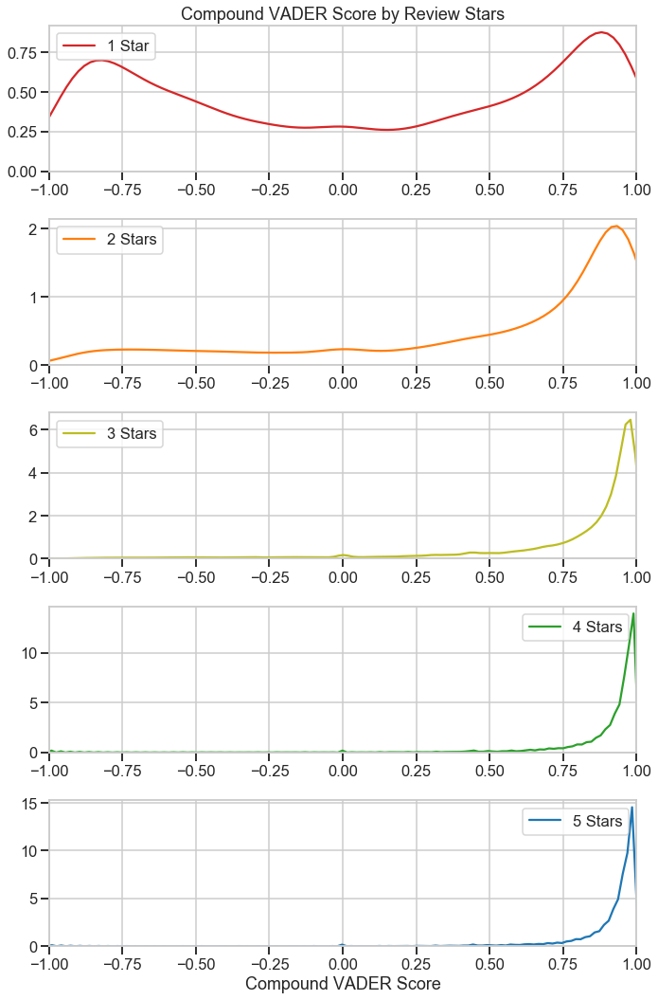

In [20]:
# plot distribution of compound scores by review score

fig, axes = plt.subplots(5, 1, figsize=(10, 15))

sns.distplot(df_clean.loc[df_clean['score']==1,'compound'], hist=False, color='tab:red', label='1 Star', ax=axes[0])
sns.distplot(df_clean.loc[df_clean['score']==2,'compound'], hist=False, color='tab:orange', label='2 Stars', ax=axes[1])
sns.distplot(df_clean.loc[df_clean['score']==3,'compound'], hist=False, color='tab:olive', label='3 Stars', ax=axes[2])
sns.distplot(df_clean.loc[df_clean['score']==4,'compound'], hist=False, color='tab:green', label='4 Stars', ax=axes[3])
sns.distplot(df_clean.loc[df_clean['score']==5,'compound'], hist=False, color='tab:blue', label='5 Stars' ,ax=axes[4])
axes[0].set_title('Compound VADER Score by Review Stars')
for ax in range(4):
    axes[ax].set_xlabel('')
for ax in range(5):
    axes[ax].set_xlim(-1,1)
axes[4].set_xlabel('Compound VADER Score')
plt.tight_layout()

Scores of 1 and 2 are more likely to have low compound VADER scores, as expected; scores of 3 or more have highly positive VADER scores.

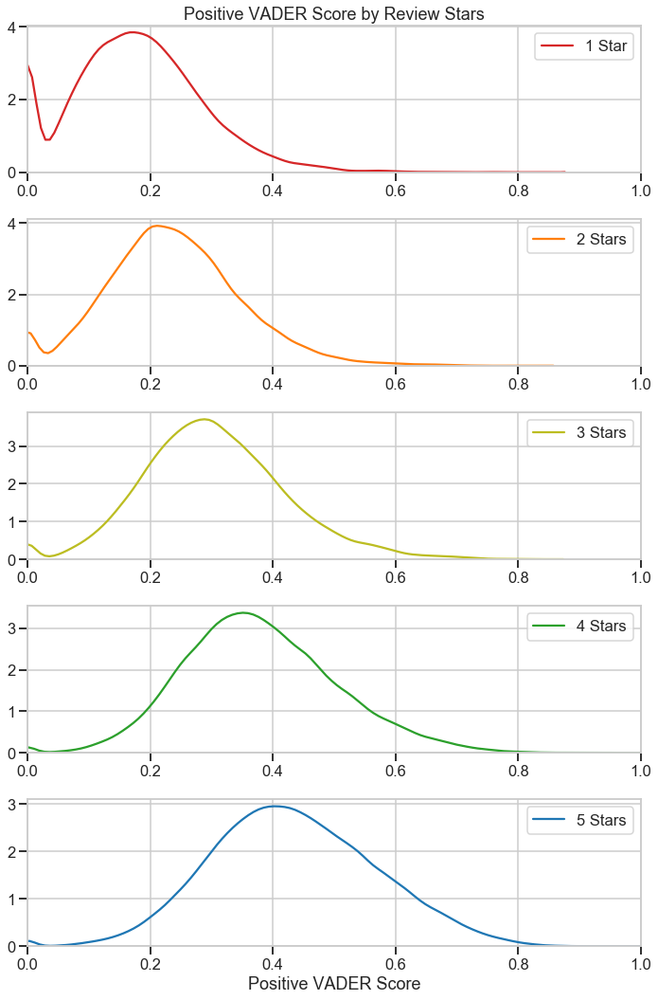

In [21]:
# plot distribution of positive scores by review score

fig, axes = plt.subplots(5, 1, figsize=(10, 15))

sns.distplot(df_clean.loc[df_clean['score']==1,'pos'], hist=False, color='tab:red', label='1 Star', ax=axes[0])
sns.distplot(df_clean.loc[df_clean['score']==2,'pos'], hist=False, color='tab:orange', label='2 Stars', ax=axes[1])
sns.distplot(df_clean.loc[df_clean['score']==3,'pos'], hist=False, color='tab:olive', label='3 Stars', ax=axes[2])
sns.distplot(df_clean.loc[df_clean['score']==4,'pos'], hist=False, color='tab:green', label='4 Stars', ax=axes[3])
sns.distplot(df_clean.loc[df_clean['score']==5,'pos'], hist=False, color='tab:blue', label='5 Stars' ,ax=axes[4])
axes[0].set_title('Positive VADER Score by Review Stars')
for ax in range(4):
    axes[ax].set_xlabel('')
axes[4].set_xlabel('Positive VADER Score')
for ax in range(5):
    axes[ax].set_xlim(0,1)
plt.tight_layout()

There is a clear right shift as stars increase in the positive VADER score, as expected. Of note, there are peaks at 0: these are reviews that have no positive terms. My guess is that these are peaks due to sample size - one positive word dramatically affects the positive score in reviews that are relatively short.

In [22]:
df_clean.loc[df_clean['pos']==0, ['description', 'neg', 'neu', 'pos', 'compound']].head()

,description,neg,neu,pos,compound
269,There goes the diet! Gonna have to to go ther...,0.000,1.000,0.0,0.0000
412,"Thick crust pizza, if that's your taste (not m...",0.000,1.000,0.0,0.0000
606,Worst diner ever. Gyro wrap was awful. Served ...,0.394,0.606,0.0,-0.7579
612,"Basic Diner food, average prices.",0.000,1.000,0.0,0.0000
663,Cold food was delivered to the table. Hair in ...,0.171,0.829,0.0,-0.4767


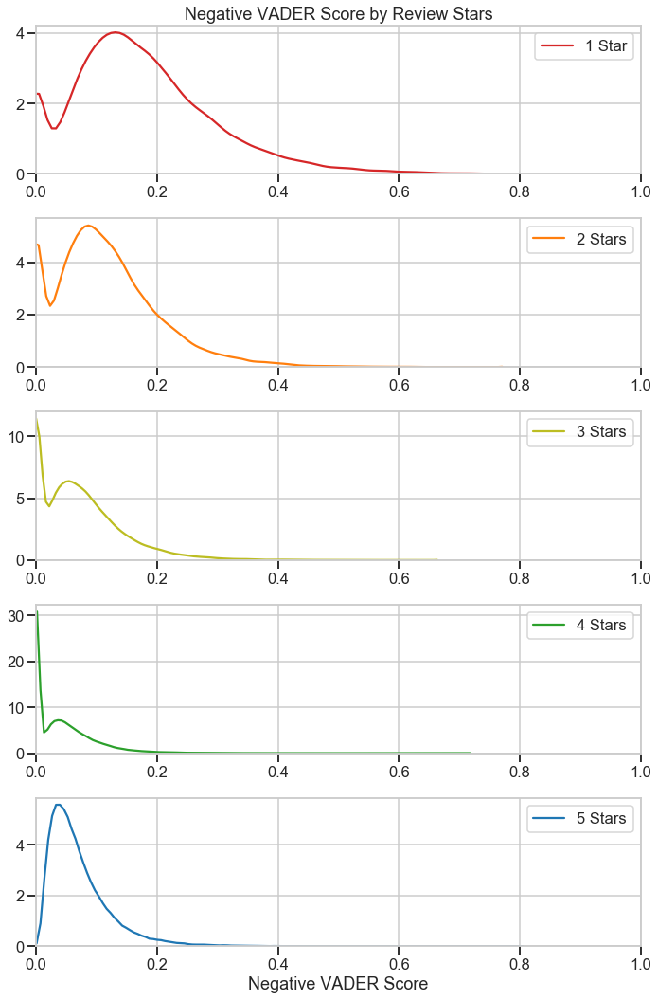

In [23]:
# plot distribution of negative scores by review score

fig, axes = plt.subplots(5, 1, figsize=(10, 15))

sns.distplot(df_clean.loc[df_clean['score']==1,'neg'], hist=False, color='tab:red', label='1 Star', ax=axes[0])
sns.distplot(df_clean.loc[df_clean['score']==2,'neg'], hist=False, color='tab:orange', label='2 Stars', ax=axes[1])
sns.distplot(df_clean.loc[df_clean['score']==3,'neg'], hist=False, color='tab:olive', label='3 Stars', ax=axes[2])
sns.distplot(df_clean.loc[df_clean['score']==4,'neg'], hist=False, color='tab:green', label='4 Stars', ax=axes[3])
sns.distplot(df_clean.loc[df_clean['score']==5,'neg'], hist=False, color='tab:blue', label='5 Stars' ,ax=axes[4])
axes[0].set_title('Negative VADER Score by Review Stars')
for ax in range(4):
    axes[ax].set_xlabel('')
for ax in range(5):
    axes[ax].set_xlim(0,1)
axes[4].set_xlabel('Negative VADER Score')
plt.tight_layout()

With negative scores, we see an increase in neutral sentiment for 2-4 stars, as expected. The highest negative scores (recall, higher negative scores are worse, not more positive) can be observed with lower stars. 

Again, we see odd peaks at 0, and those can also be explained by reviews that contain no negative terms. 

In [24]:
df_clean.loc[df_clean['neg']==0, ['description', 'neg', 'neu', 'pos', 'compound']].head()

,description,neg,neu,pos,compound
4,Came here with some work colleagues and ordere...,0.0,0.699,0.301,0.9281
8,Very cute and cozy pub spot. Perfect for a cas...,0.0,0.489,0.511,0.9854
11,"Excellent food, service and atmosphere!\nAweso...",0.0,0.346,0.654,0.9632
15,I had the chicken parmigiana. It was great and...,0.0,0.350,0.650,0.9186
17,Welly's is probably one of the busiest restaur...,0.0,0.509,0.491,0.9776


Generally, the VADER scores correlate with review stars, which confirms that sentiment can be determined using VADER. 

#### Overall Sentiment by Region
Here, I evaluate overall sentiment by region, regardless of timeframe.  

[Return to Top: Overall Sentiment](#Overall-Sentiment)

##### Compound VADER Score - Overall by Region

In [25]:
all_county_compound_bootstrap = bootstrap_all(df_clean['city_x'].unique(), df_clean, 'city_x', 'compound')

In [26]:
# counties with significantly higher compound scores overall
all_county_compound_bootstrap[all_county_compound_bootstrap['p-value_high']<0.05].sort_values('Mean', ascending=False)

,Variable,Mean,Mean of Others,Mean Difference,95% CI,p-value_high,p-value_low
1,"Philadelphia, Pennsylvania",0.873979,0.788811,0.085168,"[0.08077785041900973, 0.08952961915999184]",0.0000,1.0000
14,"New York City, New York",0.853246,0.789944,0.063302,"[0.05861237384448992, 0.06807079922183527]",0.0000,1.0000
16,"Los Angeles, California",0.853244,0.789900,0.063344,"[0.0585651897584104, 0.0680733043902514]",0.0000,1.0000
22,"Cook, Illinois",0.843622,0.790768,0.052854,"[0.047854348069286956, 0.05782488460563287]",0.0000,1.0000
3,"Jefferson, Louisiana",0.839935,0.790932,0.049003,"[0.044166633825323494, 0.05389760245786788]",0.0000,1.0000
2,"Hartford, Connecticut",0.818161,0.792612,0.025549,"[0.019364172046849225, 0.031567327151138164]",0.0000,1.0000
6,"Hudson, New Jersey",0.813403,0.793135,0.020268,"[0.01261969211589285, 0.02791421681859141]",0.0000,1.0000
10,"Essex, New Jersey",0.810269,0.792893,0.017376,"[0.01139138141654953, 0.023239607027634845]",0.0000,1.0000
19,"Bergen, New Jersey",0.809339,0.792878,0.016461,"[0.01084991702520183, 0.022103801972065327]",0.0000,1.0000
11,"New Haven, Connecticut",0.803308,0.793265,0.010043,"[0.003944477673485852, 0.016054235207837247]",0.0001,0.9999


In [27]:
# counties with significantly lower compound scores overall
all_county_compound_bootstrap[all_county_compound_bootstrap['p-value_low']<0.05].sort_values('Mean')

,Variable,Mean,Mean of Others,Mean Difference,95% CI,p-value_high,p-value_low
18,"Orleans, Louisiana",0.602798,0.795228,-0.192430,"[-0.21422975363930313, -0.17065864630597327]",1.0000,0.0000
23,"King, Washington",0.667522,0.795621,-0.128099,"[-0.14261460972738235, -0.11342700897276661]",1.0000,0.0000
4,"Nassau, New York",0.687086,0.794226,-0.107140,"[-0.133010361358894, -0.08194399420302245]",1.0000,0.0000
7,"Suffolk, New York",0.694652,0.796718,-0.102066,"[-0.11197343766327063, -0.09195154922360023]",1.0000,0.0000
0,"Middlesex, Massachusetts",0.714603,0.797328,-0.082725,"[-0.09071223531785108, -0.0748992450679393]",1.0000,0.0000
8,"Macomb, Michigan",0.733411,0.796187,-0.062776,"[-0.07090089502375414, -0.05468129085249797]",1.0000,0.0000
12,"Oakland, Michigan",0.735575,0.795732,-0.060157,"[-0.06889297509805985, -0.051375903481605985]",1.0000,0.0000
21,"Wayne, Michigan",0.736850,0.796009,-0.059160,"[-0.0670723902438475, -0.05130345585855289]",1.0000,0.0000
15,"Fairfield, Connecticut",0.758847,0.795243,-0.036397,"[-0.04403464923824978, -0.028956047749932653]",1.0000,0.0000
20,"Passaic, New Jersey",0.759222,0.794390,-0.035168,"[-0.04646129610259268, -0.024246784310107537]",1.0000,0.0000


In [28]:
compound_restaurant_plot = restaurant_df.merge(df_clean.groupby('restaurant_id').mean()['compound'], left_on='restaurant_id', right_index=True) 
compound_restaurant_plot['text'] = compound_restaurant_plot['city_x'] + ' (' + compound_restaurant_plot['name'] + '): ' + round(compound_restaurant_plot['compound'],2).astype(str)
data = go.Scattergeo(lon = compound_restaurant_plot['longitude'],
                     lat = compound_restaurant_plot['latitude'],
                     text = compound_restaurant_plot['text'],
                     mode = 'markers',
                     marker_color = compound_restaurant_plot['compound'],
                    )
layout = dict(title = 'Distribution of Restaurants with Compound Score Variation Shown',
              geo_scope = 'usa')
choromap = go.Figure(data=[data], layout=layout)
iplot(choromap)
choromap.write_html('plotly_figures/restaurant_distribution_compound.html')

While most restaurants have high compound scores of 0.7-1 (green), restaurants with lower mean scores are shown in pink/red. Some of the regions with **significantly higher** mean compound scores include Philadelphia, Pennsylvania; New York City, New York; and Los Angeles, California. Some of the regions with **significantly lower** compound scores include Orleans, Louisiana; King, Washington; and Nassau, New York.

##### Positive VADER Score - Overall by Region

In [29]:
all_county_pos_bootstrap = bootstrap_all(df_clean['city_x'].unique(), df_clean, 'city_x', 'pos')

In [30]:
# counties with significantly higher positive scores overall
all_county_pos_bootstrap[all_county_pos_bootstrap['p-value_high']<0.05].sort_values('Mean', ascending=False)

,Variable,Mean,Mean of Others,Mean Difference,95% CI,p-value_high,p-value_low
5,"Rockland, New York",0.396398,0.372187,0.024211,"[0.021062218492274253, 0.02728893093134454]",0.0000,1.0000
19,"Bergen, New Jersey",0.384771,0.372365,0.012406,"[0.010076199883068685, 0.01473888238337561]",0.0000,1.0000
15,"Fairfield, Connecticut",0.382265,0.372632,0.009633,"[0.006833570771595051, 0.012473774770293294]",0.0000,1.0000
9,"Westchester, New York",0.382231,0.372580,0.009650,"[0.007076921606878435, 0.012255351534690737]",0.0000,1.0000
10,"Essex, New Jersey",0.380363,0.372643,0.007720,"[0.005296228258989604, 0.010076122581355401]",0.0000,1.0000
20,"Passaic, New Jersey",0.380208,0.372894,0.007314,"[0.003087580440167945, 0.011582603644103818]",0.0003,0.9997
12,"Oakland, Michigan",0.376679,0.372902,0.003777,"[0.0005384553530575917, 0.006934408479183607]",0.0095,0.9905
17,"Morris, New Jersey",0.376027,0.372864,0.003164,"[0.0006624711495997805, 0.0056089400364047175]",0.0049,0.9951
24,"Union, New Jersey",0.375808,0.372924,0.002884,"[-5.043839661320875e-05, 0.005755536421096631]",0.0265,0.9735


In [31]:
pos_restaurant_plot = restaurant_df.merge(df_clean.groupby('restaurant_id').mean()['pos'], left_on='restaurant_id', right_index=True) 
pos_restaurant_plot['text'] = pos_restaurant_plot['city_x'] + ' (' + pos_restaurant_plot['name'] + '): ' + round(pos_restaurant_plot['pos'],2).astype(str)
data = go.Scattergeo(lon = pos_restaurant_plot['longitude'],
                     lat = pos_restaurant_plot['latitude'],
                     text = pos_restaurant_plot['text'],
                     mode = 'markers',
                     marker_color = pos_restaurant_plot['pos'],
                    )
layout = dict(title = 'Distribution of Restaurants with Positive Score Variation Shown',
              geo_scope = 'usa')
choromap = go.Figure(data=[data], layout=layout)
iplot(choromap)
choromap.write_html('plotly_figures/restaurant_distribution_positive.html')

Positive sentiment by region tends to range, on average, from 0.32-0.4. Regions with **significantly higher** positive scores include Rockland, New York; Bergen, New Jersey; and Fairfield, Connecticut. Significantly lower positive scores are excluded since lower scores indicate neutrality, not negativity.

##### Negative VADER Score - Overall by Region

In [32]:
all_county_neg_bootstrap = bootstrap_all(df_clean['city_x'].unique(), df_clean, 'city_x', 'neg')

In [33]:
# counties with significantly higher negative scores overall
all_county_neg_bootstrap[all_county_neg_bootstrap['p-value_high']<0.05]

,Variable,Mean,Mean of Others,Mean Difference,95% CI,p-value_high,p-value_low
0,"Middlesex, Massachusetts",0.065436,0.055436,0.010000,"[0.008548087503426303, 0.011464713886861]",0.0000,1.0000
4,"Nassau, New York",0.069143,0.055809,0.013334,"[0.008736076062500531, 0.017944556222490516]",0.0000,1.0000
7,"Suffolk, New York",0.071529,0.055399,0.016130,"[0.014230156505079495, 0.01806627426976646]",0.0000,1.0000
8,"Macomb, Michigan",0.064661,0.055513,0.009148,"[0.0076507493439311805, 0.01061105918547933]",0.0000,1.0000
9,"Westchester, New York",0.057174,0.055804,0.001370,"[8.90880580130453e-05, 0.00265157368245984]",0.0197,0.9803
12,"Oakland, Michigan",0.063670,0.055602,0.008068,"[0.00638150183637689, 0.00974267482786758]",0.0000,1.0000
15,"Fairfield, Connecticut",0.059755,0.055702,0.004053,"[0.002614971469060173, 0.005495127774840707]",0.0000,1.0000
18,"Orleans, Louisiana",0.081527,0.055670,0.025857,"[0.021869652481574634, 0.03000164622114672]",0.0000,1.0000
20,"Passaic, New Jersey",0.058200,0.055825,0.002375,"[0.0002686794613891199, 0.004489403234177783]",0.0149,0.9851
21,"Wayne, Michigan",0.063186,0.055578,0.007608,"[0.0060559926917489095, 0.00913404724295446]",0.0000,1.0000


In [34]:
neg_restaurant_plot = restaurant_df.merge(df_clean.groupby('restaurant_id').mean()['neg'], left_on='restaurant_id', right_index=True) 
neg_restaurant_plot['text'] = neg_restaurant_plot['city_x'] + ' (' + neg_restaurant_plot['name'] + '): ' + round(neg_restaurant_plot['neg'],2).astype(str)
data = go.Scattergeo(lon = neg_restaurant_plot['longitude'],
                     lat = neg_restaurant_plot['latitude'],
                     text = neg_restaurant_plot['text'],
                     mode = 'markers',
                     marker_color = neg_restaurant_plot['neg'],
                    )
layout = dict(title = 'Distribution of Restaurants with Negative Score Variation Shown',
              geo_scope = 'usa')
choromap = go.Figure(data=[data], layout=layout)
iplot(choromap)
choromap.write_html('plotly_figures/restaurant_distribution_negative.html')

Negative sentiment by region tends to range, on average, from 0.04-0.08. Regions with **significantly higher** negative VADER scores include Middlesex, Massachusetts; Nassau, New York; and Suffolk, New York. Significantly lower negative scores are included since lower scores indicate neutrality, not positivity.

##### Overall Sentiment Conclusions
While there are trends by region, e.g., the overall most positive reviews occur in Philadelphia and New York and the most negative reviews occur in New Orleans and Seattle, zooming in on specific regions shows variation at the restaurant level, making it difficult to draw conclusions about trends in specific regions. 

***
### Sentiment Pre- and Post-Lockdown
How have the distribution of review stars and compound, positive, and negative VADER scores changed before and after lockdown?  

Here, I examine how review stars and VADER scores differ before and after lockdown, where lockdown is defined as March 15, 2020.

- [Review Stars](#Review-Stars)  
- [Compound VADER Scores](#Compound-VADER-Scores)  
- [Positive VADER Scores](#Positive-VADER-Scores)  
- [Negative VADER Scores](#Negative-VADER-Scores)  
  
[Return to Top: Sentiment Analysis](#Sentiment-Analysis)

In [35]:
# create subset dfs based on covid lockdown
post_covid = df_clean[df_clean['Post-COVID Lockdown']==1]
pre_covid = df_clean[df_clean['Post-COVID Lockdown']==0]

#### Review Stars
Yelp reviews require the customer to assign a 1-5 star rating, 1 being the worst and 5 being the best.  

[Return to Top: Sentiment Pre- and Post-Lockdown](#Sentiment-Pre--and-Post-Lockdown)

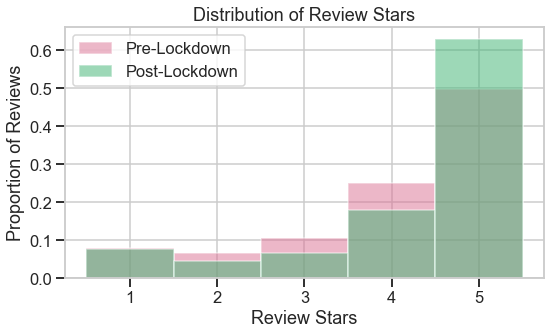

In [36]:
plt.figure(figsize=(8,5))
plt.bar(pre_covid['score'].value_counts(normalize=True).sort_index().index, 
        pre_covid['score'].value_counts(normalize=True).sort_index(),
        alpha=0.5, color='palevioletred', width=1, label='Pre-Lockdown')
plt.bar(post_covid['score'].value_counts(normalize=True).sort_index().index, 
        post_covid['score'].value_counts(normalize=True).sort_index(),
        alpha=0.5, color='mediumseagreen', width=1, label='Post-Lockdown')
plt.title('Distribution of Review Stars')
plt.xlabel('Review Stars')
plt.ylabel('Proportion of Reviews')
plt.legend()
plt.tight_layout()

We can see that the proporiton of 5-star reviews has increased post-lockdown; however, the proportion of 1-star reviews appears to be about the same, and the proportion of neutral reviews has decreased.

In [37]:
# random sample of 5-star reviews post-lockdown
for idx, row in post_covid[post_covid['score']==5].sample(5).iterrows():
    print('\n---Restaurant Name: {}---'.format(row['name']))
    print('City: {}'.format(row['city_x']))
    print('Review Stars: {}'.format(row['score']))
    print('Review Date: {}\n'.format(row['publish_date']))
    print(row['description'])


---Restaurant Name: Mecha Noodle Bar---
City: Fairfield, Connecticut
Review Stars: 5.0
Review Date: 2020-03-18

Love it.  There must be a million calories in these dishes - but you only live once.  Crowds are amazing because its so good and so you'll find yourself eating somewhat communally depending on the size of your group - but it'll be so good you won't care - and its fun (now lets just pray that Corona goes away fast....) Pray.

---Restaurant Name: Hometown Bar-B-Que---
City: New York City, New York
Review Stars: 5.0
Review Date: 2020-04-11

Made our way to Fairway and Hometown BBQ today.  Talk about killing two birds with one stone.  Absolutely fantastic.  If there is a better BBQ joint in NYC, somebody kindly let me know.  

P.S.  What a pathetic review by Sen-Pei.  You should be ashamed of yourself.  Really.  Restaurants and their employees are suffering enough and you decide to post a one star review during a pandemic AND race bait on top of it?

---Restaurant Name: Sandra's

In [38]:
# sample of 1-star reviews post-lockdown
for idx, row in post_covid[post_covid['score']==1].sample(5).iterrows():
    print('\n---Restaurant Name: {}---'.format(row['name']))
    print('City: {}'.format(row['city_x']))
    print('Review Stars: {}'.format(row['score']))
    print('Review Date: {}\n'.format(row['publish_date']))
    print(row['description'])


---Restaurant Name: Qing Xiang Yuan Dumplings---
City: Cook, Illinois
Review Stars: 1.0
Review Date: 2020-03-16

My post got removed because it was deemed as wanting attention. I only spoke of my experience and there about how they discriminated against me as an Asian. Only because I was wearing a face mask. It was poor customer service on the staff and it should be known. 

There has been other incidents where Asians were forced to leave or refused entry by the manager. This is because they were also wearing face masks. This is a case of discrimination due to recent events and it should not be tolerated.

---Restaurant Name: Mighty Quinn's Barbeque---
City: Essex, New Jersey
Review Stars: 1.0
Review Date: 2020-03-22

Got barbecue for take out got home to a bowl of pure lard...I eat bbq all the time but this was a discraceful, sad pile of lard...

---Restaurant Name: Nonna's---
City: Morris, New Jersey
Review Stars: 1.0
Review Date: 2020-04-12

Ordered an Italian sub and the bread was

#### Compound VADER Scores
Here, I compare compound scores before and after lockdown. 

[Return to Top: Sentiment Pre- and Post-Lockdown](#Sentiment-Pre--and-Post-Lockdown)

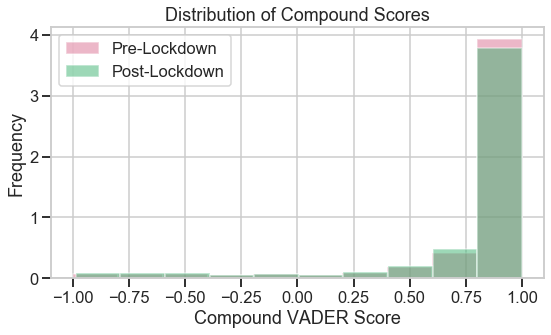

In [39]:
plt.figure(figsize=(8,5))
plt.hist(pre_covid['compound'], alpha=0.5, color='palevioletred', bins=10, label='Pre-Lockdown', normed=True)
plt.hist(post_covid['compound'], alpha=0.5, color='mediumseagreen', bins=10, label='Post-Lockdown', normed=True)
plt.title('Distribution of Compound Scores')
plt.xlabel('Compound VADER Score')
plt.ylabel('Frequency')
plt.legend()
plt.tight_layout()

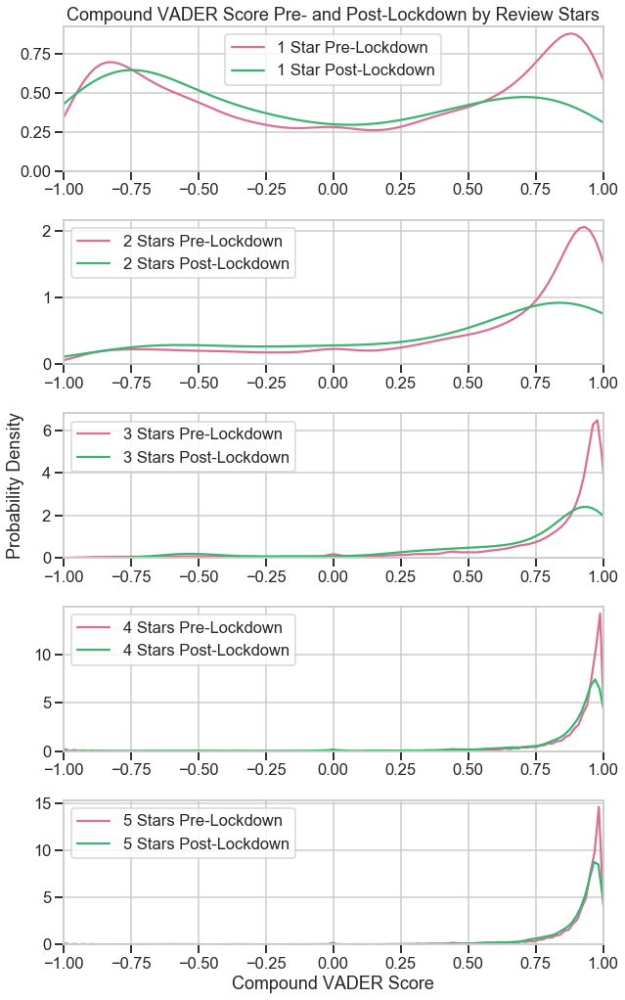

In [40]:
# plot distribution of compound scores by review stars  pre- and post-lockdown

fig, axes = plt.subplots(5, 1, figsize=(10, 15))

sns.distplot(pre_covid.loc[pre_covid['score']==1,'compound'], hist=False, norm_hist=True, color='palevioletred', label='1 Star Pre-Lockdown', ax=axes[0])
sns.distplot(post_covid.loc[post_covid['score']==1,'compound'], hist=False, norm_hist=True, color='mediumseagreen', label='1 Star Post-Lockdown', ax=axes[0])
sns.distplot(pre_covid.loc[pre_covid['score']==2,'compound'], hist=False, norm_hist=True, color='palevioletred', label='2 Stars Pre-Lockdown', ax=axes[1])
sns.distplot(post_covid.loc[post_covid['score']==2,'compound'], hist=False, norm_hist=True, color='mediumseagreen', label='2 Stars Post-Lockdown', ax=axes[1])
sns.distplot(pre_covid.loc[pre_covid['score']==3,'compound'], hist=False, norm_hist=True, color='palevioletred', label='3 Stars Pre-Lockdown', ax=axes[2])
sns.distplot(post_covid.loc[post_covid['score']==3,'compound'], hist=False, norm_hist=True, color='mediumseagreen', label='3 Stars Post-Lockdown', ax=axes[2])
sns.distplot(pre_covid.loc[pre_covid['score']==4,'compound'], hist=False, norm_hist=True, color='palevioletred', label='4 Stars Pre-Lockdown', ax=axes[3])
sns.distplot(post_covid.loc[post_covid['score']==4,'compound'], hist=False, norm_hist=True, color='mediumseagreen', label='4 Stars Post-Lockdown', ax=axes[3])
sns.distplot(pre_covid.loc[pre_covid['score']==5,'compound'], hist=False, norm_hist=True, color='palevioletred', label='5 Stars Pre-Lockdown' ,ax=axes[4])
sns.distplot(post_covid.loc[post_covid['score']==5,'compound'], hist=False, norm_hist=True, color='mediumseagreen', label='5 Stars Post-Lockdown' ,ax=axes[4])

axes[0].set_title('Compound VADER Score Pre- and Post-Lockdown by Review Stars')
for ax in range(5):
    axes[ax].set_xlabel('')
for ax in range(5):
    axes[ax].set_xlim(-1,1)

fig.add_subplot(111, frame_on=False)
plt.tick_params(labelcolor="none", bottom=False, left=False)
plt.ylabel('Probability Density')
plt.xlabel('Compound VADER Score')
plt.grid(False)

plt.tight_layout()

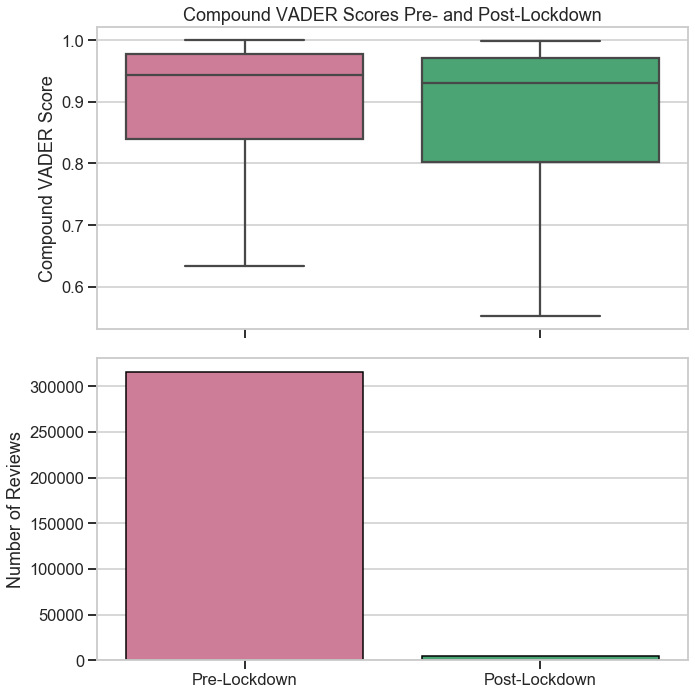

In [41]:
compound_volume = data=df_clean.groupby('Post-COVID Lockdown').count()['compound']

fig, axs = plt.subplots(2, figsize=(10,10), sharex=True)
sns.boxplot(x='Post-COVID Lockdown', y='compound', data=df_clean, 
            palette=['palevioletred', 'mediumseagreen'], showfliers=False, ax=axs[0])
sns.barplot(x=compound_volume.index, y=compound_volume, 
            palette=['palevioletred', 'mediumseagreen'], ax=axs[1], ec='k')

axs[0].set_title('Compound VADER Scores Pre- and Post-Lockdown')
axs[0].set_xlabel('')
axs[0].set_ylabel('Compound VADER Score')
axs[1].set_xlabel('')
axs[1].set_ylabel('Number of Reviews')

plt.xticks([0, 1], ['Pre-Lockdown', 'Post-Lockdown'])
plt.tight_layout()

In [42]:
# compare compound VADER score before and after lockdown
mean_diff, conf_int, p_low, p_high = bootstrap(pre_covid['compound'], post_covid['compound'])
if p_low < 0.05:
    print('The compound VADER score significantly decreased by a mean difference of {:.3f} in post-lockdown reviews; p={}'.format(np.abs(mean_diff), p_low))
elif p_high <0.05:    
    print('The compound VADER score significantly increased by a mean difference of {:.3f} in post-lockdown reviews; p={}'.format(np.abs(mean_diff), p_high))
else:
    print('No significant change in compound VADER score; p={}'.format(p_low))

The compound VADER score significantly decreased by a mean difference of 0.030 in post-lockdown reviews; p=0.0


The compound VADER score is significantly higher in post-lockdown reviews, indicating that sentiment has improved. To determine if this is due to an increase in positive sentiment or a decrease in negative sentiment, I evaluate the positive and negative VADER scores the same way.

Of note, the data are really imbalanced - there are substantially more reviews pre-lockdown. A future direction might be to select one random review pre-lockdown for every review post-lockdown for a given restaurant to create a more balanced dataset.

In [43]:
# highest compound scores post-lockdown
for idx, row in post_covid[post_covid['compound']==post_covid['compound'].max()].iterrows():
    print('\n---Restaurant Name: {}---'.format(row['name']))
    print('City: {}'.format(row['city_x']))
    print('Review Score: {}'.format(row['score']))
    print('Review Date: {}\n'.format(row['publish_date']))
    print(row['description'])


---Restaurant Name: Farmhouse---
City: Los Angeles, California
Review Score: 5.0
Review Date: 2020-03-26

It was a rainy day in Los Angeles, yes really! It was actually a gray, cold, drizzly day in the southland and after a lazy afternoon of wandering around the spacious and empty newly-renovated Beverly Center, we decided to pop into Farmhouse for a pre-dinner nosh and a cocktail. (Mind you the shopping center was filled with merchandise and light, the new skylights installed on the ceiling of the center bring in a LOT of natural light and makes the center seem like one is outdoors instead of inside. But sadly the center is devoid of shoppers or even of the dreaded lookie-loos, which in this case would be better than just standing around doing nothing for nobody. More on that in another post.)   

As a point of reference, my boyfriend, and I are big fans of happy hours and we are always on the look out to try a new bar or restaurant at an introductory price point. Although we both po

In [44]:
# lowest compound scores post-lockdown
for idx, row in post_covid[post_covid['compound']==post_covid['compound'].min()].iterrows():
    print('\n---Restaurant Name: {}---'.format(row['name']))
    print('City: {}'.format(row['city_x']))
    print('Review Score: {}'.format(row['score']))
    print('Review Date: {}\n'.format(row['publish_date']))
    print(row['description'])


---Restaurant Name: The Cheesecake Factory---
City: Passaic, New Jersey
Review Score: 1.0
Review Date: 2020-04-18

Normally cheesecake is fine besides them forgetting cake or items on pick up which has been an issue but today is different. I placed an order online for curbside pickup, when you go onto the site it says something along the lines of "all orders will be curbside pick up and you will be texted when your order is ready" So I place my order and the message on my order as well as in email form says come inside to bakery counter, upon several calls to clarify during the pandemic no one answered as per their usual unprofessionalism/poor customer service, after a while I got a fax machine sound so I hung up. Upon arriving to a load of cars I go inside to way too many people probably also confused to what to do. I wait in a long line to get to the front and after 20 minutes they tell me they can't find the order, I tell them what it is and they have no recollection and tell me to

Overall, there is a decrease in sentiment post-lockdown; however, it is difficult to interpret this, since there are so many fewer reviews available in the current data,

#### Positive VADER Scores

Here, I compare positive scores before and after lockdown. 


[Return to Top: Sentiment Pre- and Post-Lockdown](#Sentiment-Pre--and-Post-Lockdown)

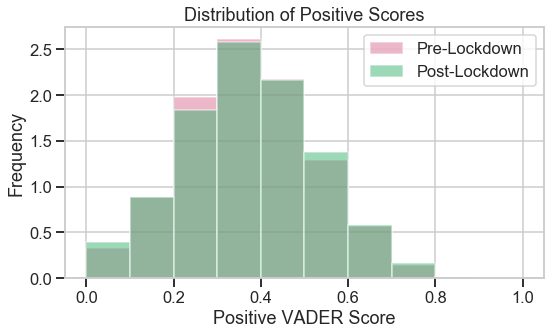

In [45]:
# add artificial max to post-covid data so scale is the same
artificial_max = post_covid[post_covid['pos']==post_covid['pos'].max()]
artificial_max['pos'] = 1
post_covid_plot = post_covid.append(artificial_max)

plt.figure(figsize=(8,5))
plt.hist(pre_covid['pos'], alpha=0.5, color='palevioletred', bins=10, label='Pre-Lockdown', normed=True)
plt.hist(post_covid_plot['pos'], alpha=0.5, color='mediumseagreen', bins=10, label='Post-Lockdown', normed=True)
plt.title('Distribution of Positive Scores')
plt.xlabel('Positive VADER Score')
plt.ylabel('Frequency')
plt.legend()
plt.tight_layout()

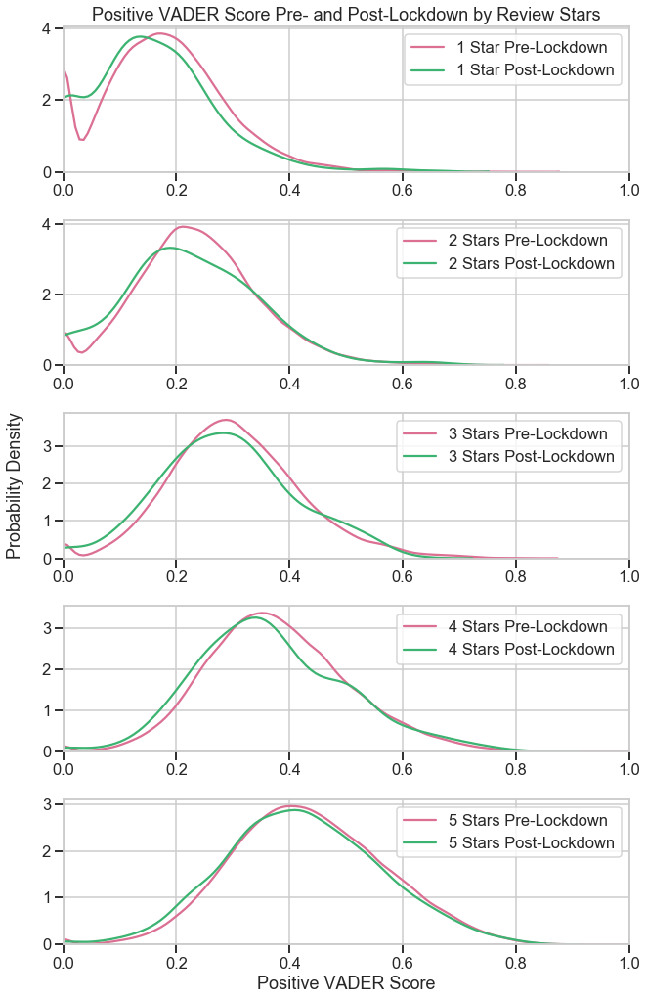

In [46]:
# plot distribution of positive scores by review for pre- or post-lockdown

fig, axes = plt.subplots(5, 1, figsize=(10, 15))

sns.distplot(pre_covid.loc[pre_covid['score']==1,'pos'], hist=False, norm_hist=True, color='palevioletred', label='1 Star Pre-Lockdown', ax=axes[0])
sns.distplot(post_covid.loc[post_covid['score']==1,'pos'], hist=False, norm_hist=True, color='mediumseagreen', label='1 Star Post-Lockdown', ax=axes[0])
sns.distplot(pre_covid.loc[pre_covid['score']==2,'pos'], hist=False, norm_hist=True, color='palevioletred', label='2 Stars Pre-Lockdown', ax=axes[1])
sns.distplot(post_covid.loc[post_covid['score']==2,'pos'], hist=False, norm_hist=True, color='mediumseagreen', label='2 Stars Post-Lockdown', ax=axes[1])
sns.distplot(pre_covid.loc[pre_covid['score']==3,'pos'], hist=False, norm_hist=True, color='palevioletred', label='3 Stars Pre-Lockdown', ax=axes[2])
sns.distplot(post_covid.loc[post_covid['score']==3,'pos'], hist=False, norm_hist=True, color='mediumseagreen', label='3 Stars Post-Lockdown', ax=axes[2])
sns.distplot(pre_covid.loc[pre_covid['score']==4,'pos'], hist=False, norm_hist=True, color='palevioletred', label='4 Stars Pre-Lockdown', ax=axes[3])
sns.distplot(post_covid.loc[post_covid['score']==4,'pos'], hist=False, norm_hist=True, color='mediumseagreen', label='4 Stars Post-Lockdown', ax=axes[3])
sns.distplot(pre_covid.loc[pre_covid['score']==5,'pos'], hist=False, norm_hist=True, color='palevioletred', label='5 Stars Pre-Lockdown' ,ax=axes[4])
sns.distplot(post_covid.loc[post_covid['score']==5,'pos'], hist=False, norm_hist=True, color='mediumseagreen', label='5 Stars Post-Lockdown' ,ax=axes[4])

axes[0].set_title('Positive VADER Score Pre- and Post-Lockdown by Review Stars')
for ax in range(5):
    axes[ax].set_xlabel('')
for ax in range(5):
    axes[ax].set_xlim(0,1)

fig.add_subplot(111, frame_on=False)
plt.tick_params(labelcolor="none", bottom=False, left=False)
plt.ylabel('Probability Density')
plt.xlabel('Positive VADER Score')
plt.grid(False)

plt.tight_layout()

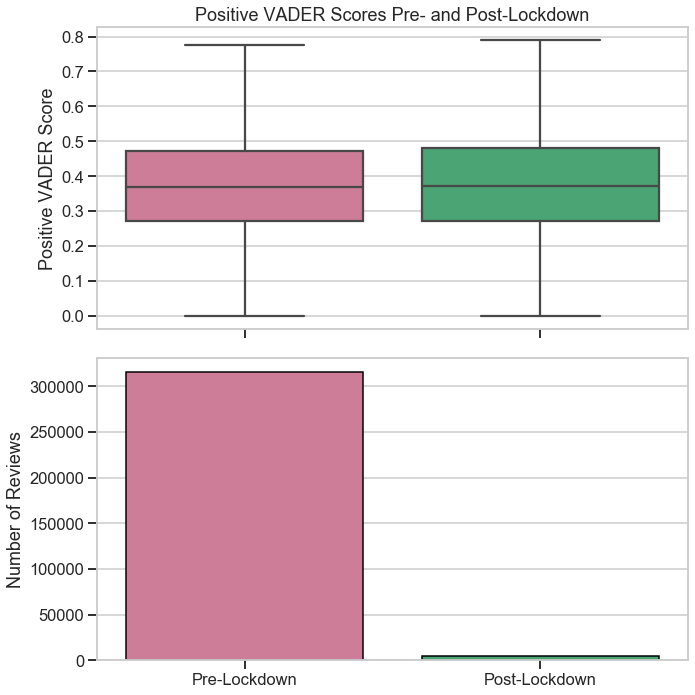

In [47]:
pos_volume = data=df_clean.groupby('Post-COVID Lockdown').count()['pos']

fig, axs = plt.subplots(2, figsize=(10,10), sharex=True)
sns.boxplot(x='Post-COVID Lockdown', y='pos', data=df_clean, 
            palette=['palevioletred', 'mediumseagreen'], showfliers=False, ax=axs[0])
sns.barplot(x=pos_volume.index, y=pos_volume, 
            palette=['palevioletred', 'mediumseagreen'], ax=axs[1], ec='k')

axs[0].set_title('Positive VADER Scores Pre- and Post-Lockdown')
axs[0].set_xlabel('')
axs[0].set_ylabel('Positive VADER Score')
axs[1].set_xlabel('')
axs[1].set_ylabel('Number of Reviews')

plt.xticks([0, 1], ['Pre-Lockdown', 'Post-Lockdown'])
plt.tight_layout()

In [48]:
mean_diff, conf_int, p_low, p_high = bootstrap(pre_covid['pos'], post_covid['pos'])
if p_low < 0.05:
    print('The positive VADER score significantly decreased by a mean difference of {:.3f} in post-lockdown reviews; p={}'.format(np.abs(mean_diff), p_low))
elif p_high <0.05:    
    print('The positive VADER score significantly increased by a mean difference of {:.3f} in post-lockdown reviews; p={}'.format(np.abs(mean_diff), p_high))
else:
    print('No significant change in positive VADER score; p={}'.format(p_low))

No significant change in positive VADER score; p=0.7416


Postive scores behave highly similarly before and after lockdown. We see a slight right-shift in the distribution towards more positive scores, though.

#### Negative VADER Scores

Here, I compare negative scores before and after lockdown. 

[Return to Top: Sentiment Pre- and Post-Lockdown](#Sentiment-Pre--and-Post-Lockdown)

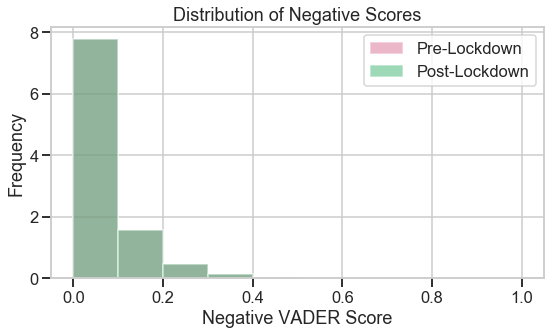

In [49]:
# add artificial max to pre- and post-covid data so scale is the same
artificial_max_post = post_covid[post_covid['neg']==post_covid['neg'].max()]
artificial_max_post['neg'] = 1
post_covid_plot = post_covid.append(artificial_max_post)

artificial_max_pre = pre_covid[pre_covid['neg']==pre_covid['neg'].max()]
artificial_max_pre['neg'] = 1
pre_covid_plot = post_covid.append(artificial_max_pre)

plt.figure(figsize=(8,5))
plt.hist(pre_covid_plot['neg'], alpha=0.5, color='palevioletred', bins=10, label='Pre-Lockdown', normed=True)
plt.hist(post_covid_plot['neg'], alpha=0.5, color='mediumseagreen', bins=10, label='Post-Lockdown', normed=True)
plt.title('Distribution of Negative Scores')
plt.xlabel('Negative VADER Score')
plt.ylabel('Frequency')
plt.legend()
plt.tight_layout()

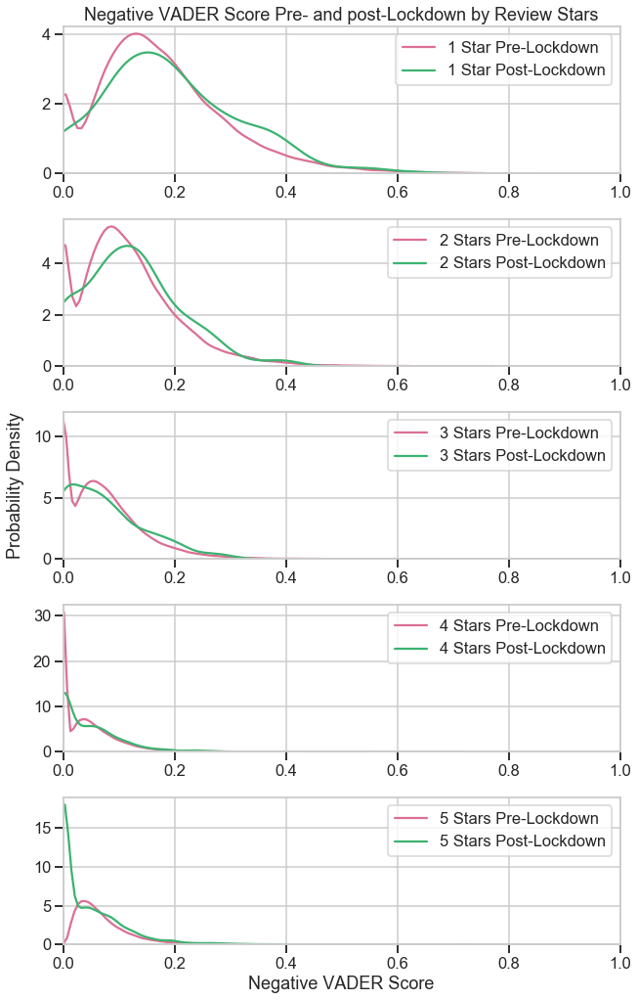

In [50]:
# plot distribution of negative scores by review for pre- or post-lockdown

fig, axes = plt.subplots(5, 1, figsize=(10, 15))

sns.distplot(pre_covid.loc[pre_covid['score']==1,'neg'], hist=False, norm_hist=True, color='palevioletred', label='1 Star Pre-Lockdown', ax=axes[0])
sns.distplot(post_covid.loc[post_covid['score']==1,'neg'], hist=False, norm_hist=True, color='mediumseagreen', label='1 Star Post-Lockdown', ax=axes[0])
sns.distplot(pre_covid.loc[pre_covid['score']==2,'neg'], hist=False, norm_hist=True, color='palevioletred', label='2 Stars Pre-Lockdown', ax=axes[1])
sns.distplot(post_covid.loc[post_covid['score']==2,'neg'], hist=False, norm_hist=True, color='mediumseagreen', label='2 Stars Post-Lockdown', ax=axes[1])
sns.distplot(pre_covid.loc[pre_covid['score']==3,'neg'], hist=False, norm_hist=True, color='palevioletred', label='3 Stars Pre-Lockdown', ax=axes[2])
sns.distplot(post_covid.loc[post_covid['score']==3,'neg'], hist=False, norm_hist=True, color='mediumseagreen', label='3 Stars Post-Lockdown', ax=axes[2])
sns.distplot(pre_covid.loc[pre_covid['score']==4,'neg'], hist=False, norm_hist=True, color='palevioletred', label='4 Stars Pre-Lockdown', ax=axes[3])
sns.distplot(post_covid.loc[post_covid['score']==4,'neg'], hist=False, norm_hist=True, color='mediumseagreen', label='4 Stars Post-Lockdown', ax=axes[3])
sns.distplot(pre_covid.loc[pre_covid['score']==5,'neg'], hist=False, norm_hist=True, color='palevioletred', label='5 Stars Pre-Lockdown' ,ax=axes[4])
sns.distplot(post_covid.loc[post_covid['score']==5,'neg'], hist=False, norm_hist=True, color='mediumseagreen', label='5 Stars Post-Lockdown' ,ax=axes[4])

axes[0].set_title('Negative VADER Score Pre- and post-Lockdown by Review Stars')
for ax in range(5):
    axes[ax].set_xlabel('')
for ax in range(5):
    axes[ax].set_xlim(0,1)

fig.add_subplot(111, frame_on=False)
plt.tick_params(labelcolor="none", bottom=False, left=False)
plt.ylabel('Probability Density')
plt.xlabel('Negative VADER Score')
plt.grid(False)

plt.tight_layout()

Some of the spikes at 0 are due to the same issues we saw previously: reviews with no terms deemed "negative". We know the data are imbalanced overall, with fewer negative and neutral reviews than positive reviews, which could explain some of these spikes, since the y-axis is normalized.

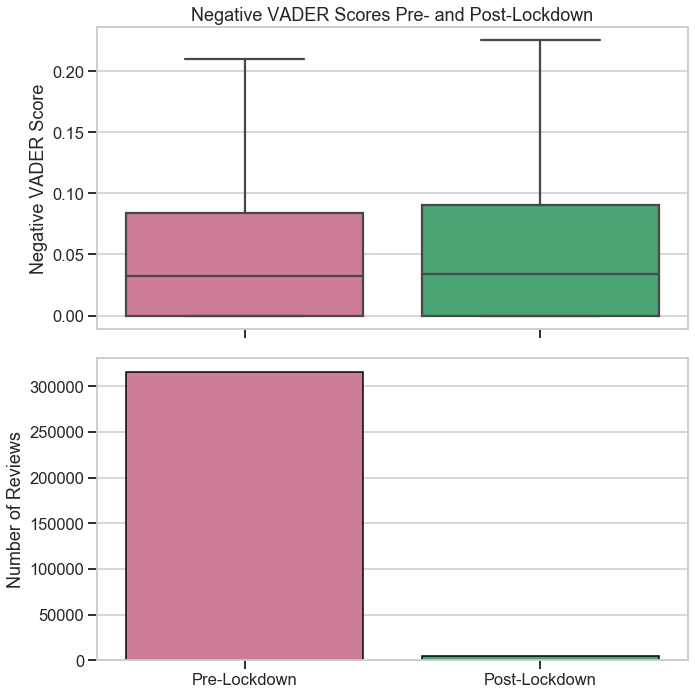

In [51]:
neg_volume = data=df_clean.groupby('Post-COVID Lockdown').count()['neg']

fig, axs = plt.subplots(2, figsize=(10,10), sharex=True)
sns.boxplot(x='Post-COVID Lockdown', y='neg', data=df_clean, 
            palette=['palevioletred', 'mediumseagreen'], showfliers=False, ax=axs[0])
sns.barplot(x=neg_volume.index, y=neg_volume, 
            palette=['palevioletred', 'mediumseagreen'], ax=axs[1], ec='k')

axs[0].set_title('Negative VADER Scores Pre- and Post-Lockdown')
axs[0].set_xlabel('')
axs[0].set_ylabel('Negative VADER Score')
axs[1].set_xlabel('')
axs[1].set_ylabel('Number of Reviews')

plt.xticks([0, 1], ['Pre-Lockdown', 'Post-Lockdown'])
plt.tight_layout()

In [52]:
mean_diff, conf_int, p_low, p_high = bootstrap(pre_covid['neg'], post_covid['neg'])
if p_low < 0.05:
    print('The negative VADER score significantly decreased by a mean difference of {:.3f} in post-lockdown reviews; p={}'.format(np.abs(mean_diff), p_low))
elif p_high <0.05:    
    print('The negative VADER score significantly increased by a mean difference of {:.3f} in post-lockdown reviews; p={}'.format(np.abs(mean_diff), p_high))
else:
    print('No significant change in negative VADER score; p={}'.format(p_low))

The negative VADER score significantly increased by a mean difference of 0.004 in post-lockdown reviews; p=0.0


The patterns for negative scores again seem similar between the two time periods. The overall distribution of negative scores looks almost identical between the two time periods.

##### Sentiment Pre- and Post-Lockdown Conclusions
Overall, restaurant sentiment has _increased_ post-lockdown due to a decrease in negative reviews; however, more data post-lockdown would really help solidify this.

***
### Sentiment Pre- and Post-Lockdown by Region
Evaluate sentiment before and after lockdown for each county.  

- [Review Stars by Region](#Review-Stars-by-Region)  
- [Compound Scores by Region](#Compound-VADER-Scores-by-Region)  
- [Positive Scores by Region](#Positive-VADER-Scores-by-Region)  
- [Negative Scores by Region](#Negative-VADER-Scores-by-Region)  
  
[Return to Top: Sentiment Analysis](#Sentiment-Analysis)

#### Review Stars by Region

[Return to Top: Sentiment Pre- and Post-Lockdown by Region](#Sentiment-Pre--and-Post-Lockdown-by-Region)

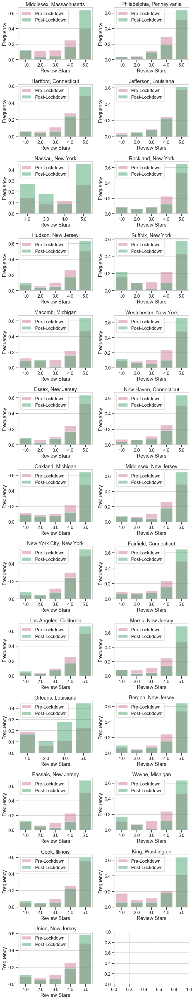

In [53]:
fig, axes = plt.subplots(13, 2, figsize=(10, 50))

for idx, city in enumerate(df_clean['city_x'].unique()):
    loc_x = 0
    loc_y = 0
    if idx % 2 == 0:
        loc_x = int(idx/2)
        loc_y = 0
    else:
        loc_x = int((idx-1)/2)
        loc_y = 1
    sns.barplot(x=pre_covid.loc[pre_covid['city_x']==city, 'score'].value_counts(normalize=True).sort_index().index,
                y=pre_covid.loc[pre_covid['city_x']==city, 'score'].value_counts(normalize=True).sort_index(),
                alpha=0.5, color='palevioletred', label='Pre-Lockdown',
                ax=axes[loc_x, loc_y])
    sns.barplot(x=post_covid.loc[post_covid['city_x']==city, 'score'].value_counts(normalize=True).sort_index().index,
                y=post_covid.loc[post_covid['city_x']==city, 'score'].value_counts(normalize=True).sort_index(),
                alpha=0.5, color='mediumseagreen', label='Post-Lockdown',
                ax=axes[loc_x, loc_y])
    axes[loc_x, loc_y].legend()
    axes[loc_x, loc_y].set_title(city)
    axes[loc_x, loc_y].set_ylabel('Frequency')
    axes[loc_x, loc_y].set_xlabel('Review Stars')

plt.tight_layout()

In many cities, the proportion of 5-star reviews seems to increase _and_ the proportion of 1-star reviews increases, indicating a decrease in neutral reviews. One city of note is Seattle, where the proportion of 1-star reviews decreased and the proportion of 5-star reviews dramatically increased, suggesting improved sentiment in the PNW.

#### Compound VADER Scores by Region
Here, I compare compound VADER scores pre- and post-lockdown by county.

[Return to Top: Sentiment Pre- and Post-Lockdown by Region](#Sentiment-Pre--and-Post-Lockdown-by-Region)

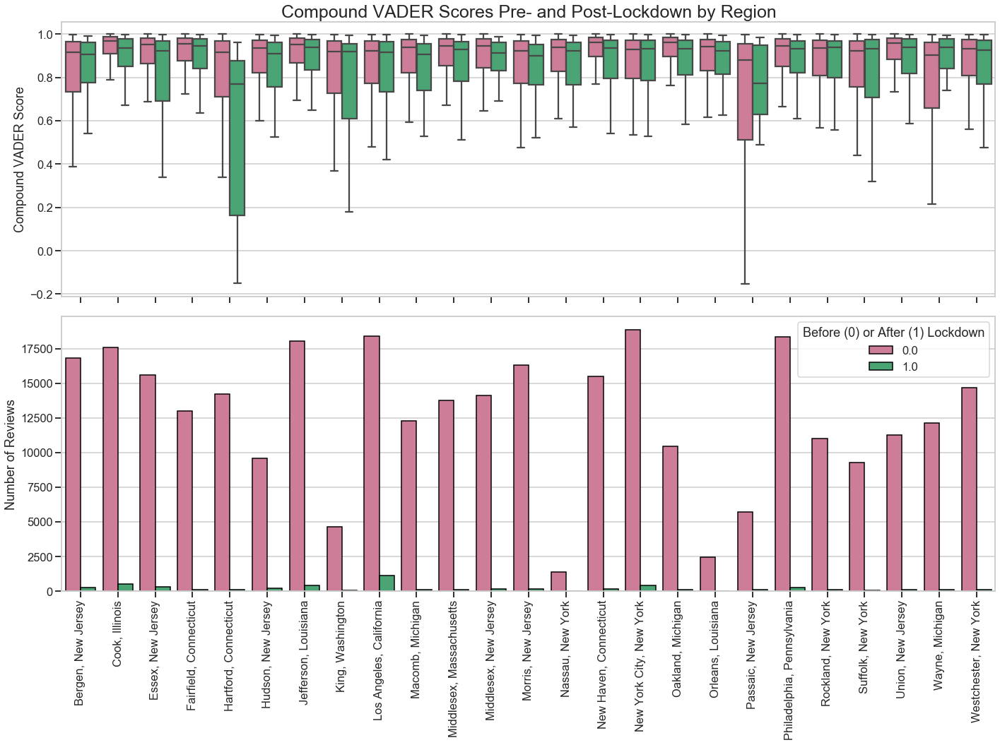

In [54]:
compound_vol_county = df_clean.groupby(['city_x', 'Post-COVID Lockdown']).count()['compound'].reset_index()

fig, axs = plt.subplots(2, figsize=(20,15), sharex=True)
sns.boxplot(x='city_x', y='compound', hue='Post-COVID Lockdown', data=df_clean, 
            palette=['palevioletred', 'mediumseagreen'], showfliers=False, ax=axs[0])
sns.barplot(x='city_x', y='compound', hue='Post-COVID Lockdown', data=compound_vol_county, 
            palette=['palevioletred', 'mediumseagreen'], ax=axs[1], ec='k')

axs[0].set_title('Compound VADER Scores Pre- and Post-Lockdown by Region', size=25)
axs[0].set_xlabel('')
axs[0].set_ylabel('Compound VADER Score')
axs[1].set_xlabel('')
axs[1].set_ylabel('Number of Reviews')
axs[0].get_legend().remove()
plt.legend(title='Before (0) or After (1) Lockdown')

plt.xticks(rotation=90)
plt.tight_layout()

In [55]:
# compare compound scores for each county pre- and post-lockdown
compound_county = []
for city in tqdm(df_clean['city_x'].unique()):  
    mean_diff, conf_int, p_low, p_high = bootstrap(df_clean.loc[(df_clean['city_x']==city) & (df_clean['Post-COVID Lockdown']==0), 'compound'],
                                                   df_clean.loc[(df_clean['city_x']==city) & (df_clean['Post-COVID Lockdown']==1), 'compound'])
    print('------')
    print('City: {}'.format(city))
    if p_low < 0.05:
        compound_county.append(city)
        print('The compound VADER score significantly decreased after lockdown; mean difference=-{:.2f}, p={}'.format(np.abs(mean_diff), p_low))
    elif p_high < 0.05:
        compound_county.append(city)
        print('The compound VADER score significantly increased after lockdown; mean difference={:.2f}, p={}'.format(np.abs(mean_diff), p_high))
    else:
        print('No significant difference in compound VADER score; p={}'.format(p_low))

------
City: Middlesex, Massachusetts
No significant difference in compound VADER score; p=0.7193
------
City: Philadelphia, Pennsylvania
The compound VADER score significantly decreased after lockdown; mean difference=-0.06, p=0.0042
------
City: Hartford, Connecticut
The compound VADER score significantly decreased after lockdown; mean difference=-0.09, p=0.0119
------
City: Jefferson, Louisiana
The compound VADER score significantly decreased after lockdown; mean difference=-0.03, p=0.0475
------
City: Nassau, New York
No significant difference in compound VADER score; p=0.1418
------
City: Rockland, New York
No significant difference in compound VADER score; p=0.1135
------
City: Hudson, New Jersey
No significant difference in compound VADER score; p=0.092
------
City: Suffolk, New York
No significant difference in compound VADER score; p=0.2636
------
City: Macomb, Michigan
No significant difference in compound VADER score; p=0.3986
------
City: Westchester, New York
No significan

In [56]:
# reviews with lowest compound scores in regions with sig. differences
for city in compound_county:
    lowest_score = post_covid.loc[post_covid['city_x']==city, 'compound'].min()
    for idx, row in post_covid[(post_covid['city_x']==city) & (post_covid['compound']==lowest_score)].iterrows():
        print('\n---City: {}---'.format(row['city_x']))
        print('Restaurant Name: {}'.format(row['name']))
        print('Review Score: {}'.format(row['score']))
        print('Review Date: {}\n'.format(row['publish_date']))
        print(row['description'])


---City: Philadelphia, Pennsylvania---
Restaurant Name: Han Dynasty
Review Score: 2.0
Review Date: 2020-03-27

COVID TAKEOUT REVIEW
Businesses are definitely struggling during these times and it saddens me to write anyone a negative review. However, I ordered fried rice from this location last night and had extremely unpleasant food poisoning since. The rice tasted stale/old and definitely funny, but I ignored it and chalked it up to weird flavoring. Big mistake. When rice specifically  is kept too long, it tends to breed a specific bacteria (b cereus) resulting in very painful food poisoning. It must be very hard to keep a business going right now, but old food, ESPECIALLY rice is not acceptable. Very disappointed in last nights meal. Won't be ordering from here.

---City: Hartford, Connecticut---
Restaurant Name: Union Kitchen
Review Score: 1.0
Review Date: 2020-03-15

Take Note:  This is my own experience.  I hope yours is different.

Never made it into the restaurant.  An online r

In [57]:
restaurant_df.loc[restaurant_df['city_x'].isin(compound_county), 'Compound Affected'] = 1
restaurant_df['Compound Affected'] = restaurant_df['Compound Affected'].fillna(0)

In [58]:
data = go.Scattergeo(lon = restaurant_df['longitude'],
                     lat = restaurant_df['latitude'],
                     text = restaurant_df['city_x'],
                     mode = 'markers',
                     marker = dict(colorscale=['cornflowerblue', 'mediumorchid']),
                     marker_color = restaurant_df['Compound Affected'],
                    )
layout = dict(title = 'Regions with Significantly Affected Compound Scores Post-Lockdown (Purple)',
              geo_scope = 'usa')
choromap = go.Figure(data=[data], layout=layout)
iplot(choromap)
choromap.write_html('plotly_figures/restaurant_distribution_significant_compound.html')

There isn't a clear geographic trend of regions with significantly different compound scores post-lockdown; however, many regions do have significant differences, possibly indicating some have handled the trasition in business strategy better than others. We see significant decreases in sentiment in Philadelphia; Hartford; Jefferson, LA; Essex, NJ; NYC; LA; Bergen, NJ; and Cook, IL (Chicago).

#### Positive VADER Scores by Region

[Return to Top: Sentiment Pre- and Post-Lockdown by Region](#Sentiment-Pre--and-Post-Lockdown-by-Region)

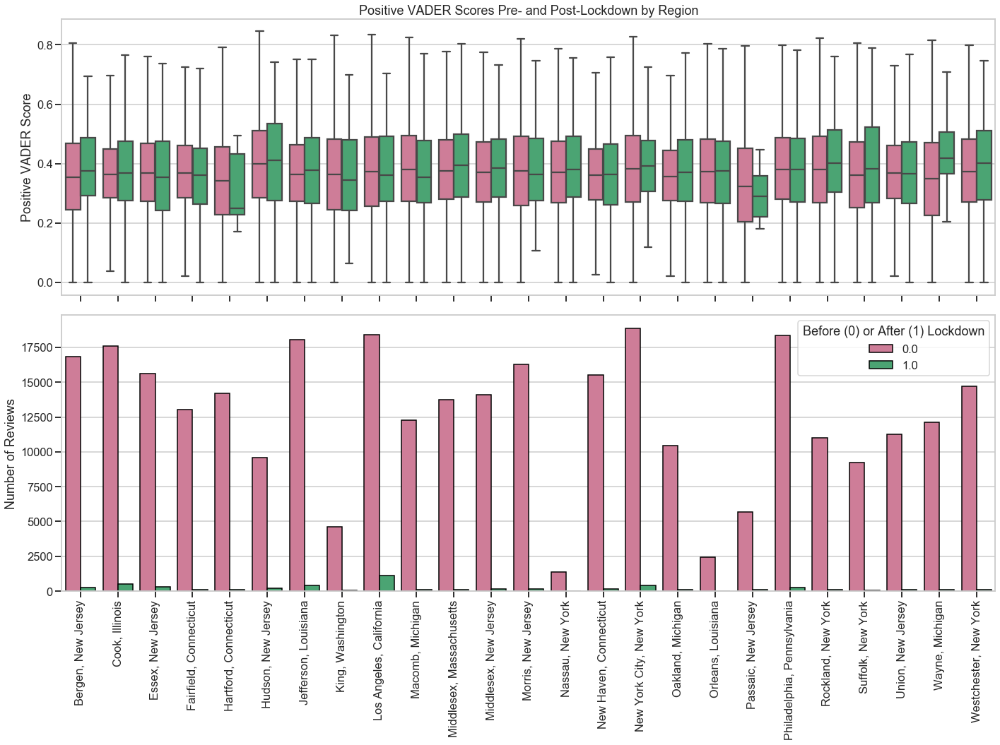

In [59]:
pos_vol_county = df_clean.groupby(['city_x', 'Post-COVID Lockdown']).count()['pos'].reset_index()

fig, axs = plt.subplots(2, figsize=(20,15), sharex=True)
sns.boxplot(x='city_x', y='pos', hue='Post-COVID Lockdown', data=df_clean, 
            palette=['palevioletred', 'mediumseagreen'], showfliers=False, ax=axs[0])
sns.barplot(x='city_x', y='pos', hue='Post-COVID Lockdown', data=pos_vol_county, 
            palette=['palevioletred', 'mediumseagreen'], ax=axs[1], ec='k')

axs[0].set_title('Positive VADER Scores Pre- and Post-Lockdown by Region')
axs[0].set_xlabel('')
axs[0].set_ylabel('Positive VADER Score')
axs[1].set_xlabel('')
axs[1].set_ylabel('Number of Reviews')
axs[0].get_legend().remove()
plt.legend(title='Before (0) or After (1) Lockdown')

plt.xticks(rotation=90)
plt.tight_layout()

In [60]:
pos_county = []
for city in tqdm(df_clean['city_x'].unique()):  
    mean_diff, conf_int, p_low, p_high = bootstrap(df_clean.loc[(df_clean['city_x']==city) & (df_clean['Post-COVID Lockdown']==0), 'pos'],
                                                   df_clean.loc[(df_clean['city_x']==city) & (df_clean['Post-COVID Lockdown']==1), 'pos'])
    print('------')
    print('City: {}'.format(city))
    if p_low < 0.05:
        pos_county.append(city)
        print('The positive VADER score significantly decreased after lockdown; mean difference=-{:.2f}, p={}'.format(np.abs(mean_diff), p_low))
    elif p_high < 0.05:
        pos_county.append(city)
        print('The positive VADER score significantly increased after lockdown; mean difference={:.2f}, p={}'.format(np.abs(mean_diff), p_high))
    else:
        print('No significant difference in positive VADER score; p={}'.format(p_low))

------
City: Middlesex, Massachusetts
No significant difference in positive VADER score; p=0.8725
------
City: Philadelphia, Pennsylvania
No significant difference in positive VADER score; p=0.7768
------
City: Hartford, Connecticut
No significant difference in positive VADER score; p=0.1568
------
City: Jefferson, Louisiana
No significant difference in positive VADER score; p=0.1406
------
City: Nassau, New York
No significant difference in positive VADER score; p=0.5335
------
City: Rockland, New York
No significant difference in positive VADER score; p=0.4776
------
City: Hudson, New Jersey
No significant difference in positive VADER score; p=0.7363
------
City: Suffolk, New York
No significant difference in positive VADER score; p=0.3628
------
City: Macomb, Michigan
No significant difference in positive VADER score; p=0.6036
------
City: Westchester, New York
No significant difference in positive VADER score; p=0.1188
------
City: Essex, New Jersey
No significant difference in pos

In [61]:
# reviews with lowest positive scores in regions with sig. differences
for city in pos_county:
    lowest_score = post_covid.loc[post_covid['city_x']==city, 'pos'].min()
    for idx, row in post_covid[(post_covid['city_x']==city) & (post_covid['pos']==lowest_score)].iterrows():
        print('\n---City: {}---'.format(row['city_x']))
        print('Restaurant Name: {}'.format(row['name']))
        print('Review Score: {}'.format(row['score']))
        print('Review Date: {}\n'.format(row['publish_date']))
        print(row['description'])


---City: Los Angeles, California---
Restaurant Name: Burgers Never Say Die
Review Score: 1.0
Review Date: 2020-04-18

Worst customer service, staff is beyond rude, disrespectful and unhelpful. We waited 30+ minutes and never even got our burgers.

---City: Los Angeles, California---
Restaurant Name: Dave's Hot Chicken
Review Score: 3.0
Review Date: 2020-03-31

Ordered the #2 combo on medium heat. 
This place is all misguided hype. It tasted very bland and the tender was dry in the slider. The medium heat level didn't really have any heat. Maybe that's where I messed up but it didn't have much flavor and was dry. Howlin Rays is much better than this place, I won't be back.

---City: Los Angeles, California---
Restaurant Name: Masa of Echo Park
Review Score: 5.0
Review Date: 2020-03-25

Grate service so far. Took my boys for pizza and dessert. Can't wait to dine in once again.

---City: Los Angeles, California---
Restaurant Name: BCD Tofu House
Review Score: 4.0
Review Date: 2020-04-08


In [62]:
# reviews with highest positive scores in regions with sig. differences
for city in pos_county:
    highest_score = post_covid.loc[post_covid['city_x']==city, 'pos'].max()
    for idx, row in post_covid[(post_covid['city_x']==city) & (post_covid['pos']==highest_score)].iterrows():
        print('\n---City: {}---'.format(row['city_x']))
        print('Restaurant Name: {}'.format(row['name']))
        print('Review Score: {}'.format(row['score']))
        print('Review Date: {}\n'.format(row['publish_date']))
        print(row['description'])


---City: Los Angeles, California---
Restaurant Name: Birdies
Review Score: 5.0
Review Date: 2020-03-27

All I can say is Chanel is the best. Thank you for your hospitality! Donuts were super yummy!

---City: Orleans, Louisiana---
Restaurant Name: Castnet Seafood
Review Score: 5.0
Review Date: 2020-03-19

Looking for a good place to buy LIVE crawfish?!? This is the spot! Crawfish comes already clean for you. LIVE And CLEAN! What could be better than that? This is my go to spot when I'm doing a boil for any gathering at my house.

---City: King, Washington---
Restaurant Name: Huxdotter Coffee
Review Score: 5.0
Review Date: 2020-04-03

Awesome place! Great baked goods and the people are very friendly. 
Definitely try it out!


In [63]:
restaurant_df.loc[restaurant_df['city_x'].isin(pos_county), 'Positive Affected'] = 1
restaurant_df['Positive Affected'] = restaurant_df['Positive Affected'].fillna(0)

data = go.Scattergeo(lon = restaurant_df['longitude'],
                     lat = restaurant_df['latitude'],
                     text = restaurant_df['city_x'],
                     mode = 'markers',
                     marker = dict(colorscale=['cornflowerblue', 'mediumorchid']),
                     marker_color = restaurant_df['Positive Affected'],
                    )
layout = dict(title = 'Regions with Significantly Affected Positive Scores Post-Lockdown (Purple)',
              geo_scope = 'usa')
choromap = go.Figure(data=[data], layout=layout)
iplot(choromap)
choromap.write_html('plotly_figures/restaurant_distribution_significant_positive.html')

Again, there isn't a clear geographic trend of regions with significantly different positive scores post-lockdown. The only region with a significantly decreased positive score is New Orleans; LA and Seattle both showed a significant increase in positive scores. 

#### Negative VADER Scores by Region
Here, I examine negative VADER scores pre- and post-lockdown by region.

[Return to Top: Sentiment Pre- and Post-Lockdown by Region](#Sentiment-Pre--and-Post-Lockdown-by-Region)

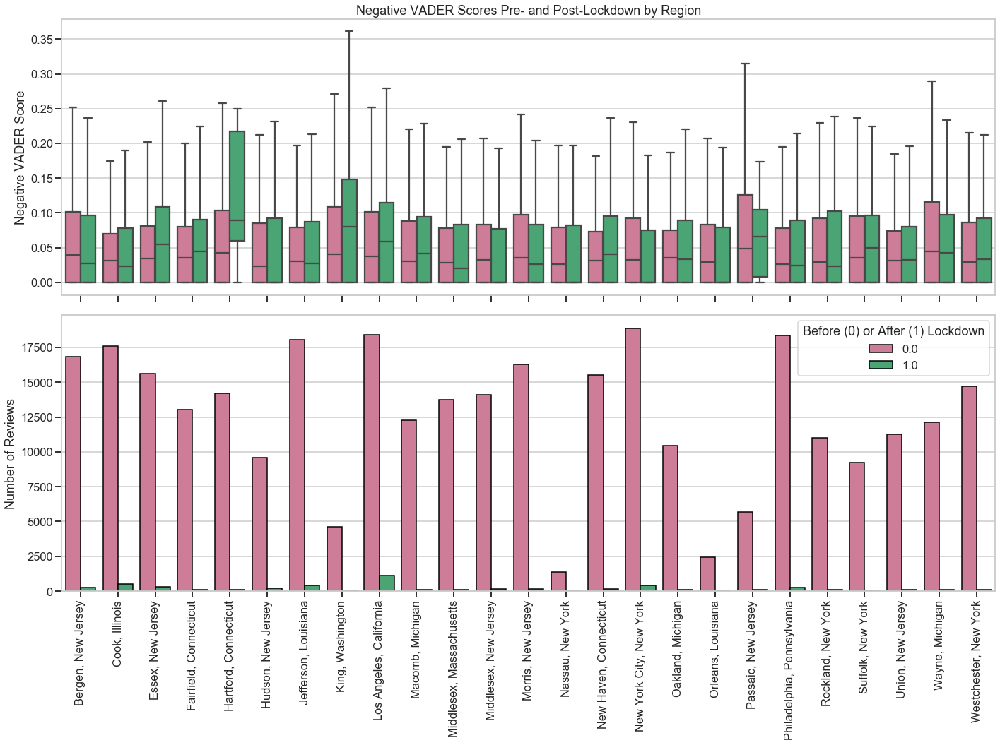

In [64]:
neg_vol_county = df_clean.groupby(['city_x', 'Post-COVID Lockdown']).count()['neg'].reset_index()

fig, axs = plt.subplots(2, figsize=(20,15), sharex=True)
sns.boxplot(x='city_x', y='neg', hue='Post-COVID Lockdown', data=df_clean, 
            palette=['palevioletred', 'mediumseagreen'], showfliers=False, ax=axs[0])
sns.barplot(x='city_x', y='neg', hue='Post-COVID Lockdown', data=neg_vol_county, 
            palette=['palevioletred', 'mediumseagreen'], ax=axs[1], ec='k')

axs[0].set_title('Negative VADER Scores Pre- and Post-Lockdown by Region')
axs[0].set_xlabel('')
axs[0].set_ylabel('Negative VADER Score')
axs[1].set_xlabel('')
axs[1].set_ylabel('Number of Reviews')
axs[0].get_legend().remove()
plt.legend(title='Before (0) or After (1) Lockdown')

plt.xticks(rotation=90)
plt.tight_layout()

In [65]:
neg_county = []
for city in tqdm(df_clean['city_x'].unique()):  
    mean_diff, conf_int, p_low, p_high = bootstrap(df_clean.loc[(df_clean['city_x']==city) & (df_clean['Post-COVID Lockdown']==0), 'neg'],
                                                   df_clean.loc[(df_clean['city_x']==city) & (df_clean['Post-COVID Lockdown']==1), 'neg'])
    print('------')
    print('City: {}'.format(city))
    if p_low < 0.05:
        neg_county.append(city)
        print('The negative VADER score significantly decreased after lockdown; mean difference=-{:.2f}, p={}'.format(np.abs(mean_diff), p_low))
    elif p_high < 0.05:
        neg_county.append(city)
        print('The negative VADER score significantly increased after lockdown; mean difference={:.2f}, p={}'.format(np.abs(mean_diff), p_high))
    else:
        print('No significant difference in negative VADER score; p={}'.format(p_low))

------
City: Middlesex, Massachusetts
No significant difference in negative VADER score; p=0.423
------
City: Philadelphia, Pennsylvania
No significant difference in negative VADER score; p=0.5787
------
City: Hartford, Connecticut
The negative VADER score significantly increased after lockdown; mean difference=0.02, p=0.0032
------
City: Jefferson, Louisiana
The negative VADER score significantly increased after lockdown; mean difference=0.01, p=0.0101
------
City: Nassau, New York
The negative VADER score significantly increased after lockdown; mean difference=0.05, p=0.036
------
City: Rockland, New York
No significant difference in negative VADER score; p=0.7423
------
City: Hudson, New Jersey
No significant difference in negative VADER score; p=0.633
------
City: Suffolk, New York
The negative VADER score significantly increased after lockdown; mean difference=0.03, p=0.0403
------
City: Macomb, Michigan
No significant difference in negative VADER score; p=0.929
------
City: Westc

In [66]:
# reviews with highest negative scores in regions with sig. differences
for city in neg_county:
    lowest_score = post_covid.loc[post_covid['city_x']==city, 'neg'].max()
    for idx, row in post_covid[(post_covid['city_x']==city) & (post_covid['neg']==lowest_score)].iterrows():
        print('\n---City: {}---'.format(row['city_x']))
        print('Restaurant Name: {}'.format(row['name']))
        print('Review Score: {}'.format(row['score']))
        print('Review Date: {}\n'.format(row['publish_date']))
        print(row['description'])


---City: Hartford, Connecticut---
Restaurant Name: Villa Of Lebanon
Review Score: 5.0
Review Date: 2020-04-09

When it comes to authentic northern Lebanese cuisine no other restaurant in CT can come close to this in fancy modest but delicious food.
Step in and do t be fooled by the appearance as you will lose yourself with every bite and forget you are in Hartford county .
Give it a try you won't be disappointed.

---City: Jefferson, Louisiana---
Restaurant Name: Bevi Seafood
Review Score: 1.0
Review Date: 2020-04-04

Just went to Bevi for crawfish. 3 cashiers ignored me while I was in line in front of the register. I left. F-y'all crawfish. It ain't even that good. I'm not paying for horrible service.

---City: Nassau, New York---
Restaurant Name: Filli's Deli & Bakery
Review Score: 1.0
Review Date: 2020-04-08

This place sucks. The employees are rude and the food is nothing special. They don't understand the concept of customer service or basic kindness. Portions are small. Take you

In [67]:
restaurant_df.loc[restaurant_df['city_x'].isin(neg_county), 'Negative Affected'] = 1
restaurant_df['Negative Affected'] = restaurant_df['Negative Affected'].fillna(0)

data = go.Scattergeo(lon = restaurant_df['longitude'],
                     lat = restaurant_df['latitude'],
                     text = restaurant_df['city_x'],
                     mode = 'markers',
                     marker = dict(colorscale=['cornflowerblue', 'mediumorchid']),
                     marker_color = restaurant_df['Negative Affected'],
                    )
layout = dict(title = 'Regions with Significantly Affected Negative Scores Post-Lockdown (Purple)',
              geo_scope = 'usa')
choromap = go.Figure(data=[data], layout=layout)
iplot(choromap)
choromap.write_html('plotly_figures/restaurant_distribution_significant_negative.html')

A number of counties experience a significant increase in negative scores (i.e., worse sentiment), including Hartford; Jefferson, LA; Nassau, NJ; Suffolk, NY; NYC; LA; and Cook, IL. 

***
### Sentiment Analysis Conclusions

While it's difficult to draw broad conclusions with a limited sample size, in general, there is a decrease in sentiment post-lockdown.

Sentiment is variable on a by-restaurant basis, and there are no clear overall geographical trends. This could be studied further with more restaurant data.

Examining all reviews together, there appears to be a decrease in sentiment post-lockdown due to an increase in negative reviews; however, the sample size post-lockdown is very small. At the time of scraping, only a month of reviews were available; a repeat analysis with more recent would be more informative.

Regionally, while some counties don't have clear trends, many also show a decrease in sentiment, also due to an increase in negative reviews. Highly cornavirus-affected areas such as New York City, LA, and adjacent counties are included in this list.

[Return to Top: Sentiment Analysis](#Sentiment-Analysis)

***
## Modeling of Reviews

&nbsp;&nbsp;a. **[Additional Data Cleaning](#Additional-Data-Cleaning)**  
&nbsp;&nbsp;b. **[TF-IDF Modeling](#TF-IDF-Modeling)**  
&nbsp;&nbsp;c. **[KMeans Clustering](#KMeans-Clustering)**  
&nbsp;&nbsp;d. **[PCA](#Principal-Component-Analysis)**  
&nbsp;&nbsp;e. **[Topic Modeling](#Topic-Modeling)**  
&nbsp;&nbsp;f. **[Coronavirus-Like Review Sentiment](#Coronavirus-Like-Review-Sentiment)**  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;_[Sentiment of the Coronavirus Cluster](#Sentiment-of-the-Coronavirus-Cluster)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[Comparison of Sentiment by Cluster](#Comparison-of-Sentiment-by-Cluster)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[Sample Reviews for the Coronavirus-Like Cluster](#Sample-Reviews-for-the-Coronavirus-Like-Cluster)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[Geographical Distribution of Coronavirus-Like Reviews](#Geographical-Distribution-of-Coronavirus-Like-Reviews)_  
&nbsp;&nbsp;g. **[Modeling Conclusions](#Modeling-Conclusions)**  

[Return to Contents](#Contents)

***
### Additional Data Cleaning
VADER requires some text components to remain intact, such as capitalization of words and punctuation, since these can influence sentiment. However. for the remainder of the analysis, we need to further clean the review text.

In [68]:
nlp = spacy.load('en')

def sentiment_tokenizer_complete(review):
    # remove new lines
    review = review.replace('\n', ' ')
    
    mytokens = nlp(review)
    
    # lemmatize; lowercase; remove spaces, punctuation, and numbers
    mytokens = [word.lemma_.lower() if word.lemma_ != '-PRON-' else word.lower_ for word in mytokens 
                if word.is_space==False and 
                word.is_punct==False and
                word.pos_!='NUM']
    
    # remove stop words
    mytokens = [word for word in mytokens if word not in STOP_WORDS]
    
    # remove words <=1 letter
    mytokens = [word for word in mytokens if len(word)>1]
        
    # join tokens back into a sentence
    clean_review = ' '.join(mytokens)
    
    return clean_review

In [69]:
%time df_clean['clean_review'] = df_clean['description'].apply(sentiment_tokenizer_complete)

CPU times: user 2h 6min 32s, sys: 6min 5s, total: 2h 12min 37s
Wall time: 1h 36min 29s


In [70]:
# checkpoint  in case the kernel dies
df_clean.to_csv('checkpoint2.csv', index=False)

In [71]:
# in case the kernel dies
df_clean = pd.read_csv('checkpoint2.csv')

***
### TF-IDF Modeling
Here, I use TF-IDF to vectorize the reviews for further analyses.

For TF-IDF modeling, I've limited the sample size to reviews only since March 1, 2020. All data ends up using >12GB of memory and causing the kernel on my computer to crash; one way around this would be running the clustering on a remote server.

[Return to Top: Modeling of Reviews](#Modeling-of-Reviews)

In [72]:
# shape prior to reducing size
df_clean.shape

(320392, 25)

In [73]:
# only use reviews since march 1 to reduce size
df_clean['publish_date'] = pd.to_datetime(df_clean['publish_date'])
df_short = df_clean[df_clean['publish_date']>='2020-03-01']
df_short.shape

(11267, 25)

In [74]:
# add tf-idfs columns
tfidf = TfidfVectorizer(min_df = 10)
tfidf_result = tfidf.fit_transform(df_short['clean_review']).toarray()
tfidf_df = pd.DataFrame(tfidf_result, columns = tfidf.get_feature_names())
tfidf_df.columns = ["word_" + str(x) for x in tfidf_df.columns]
tfidf_df.index = df_short.index
tfidf_df.shape

(11267, 3439)

***
### KMeans Clustering

Using the elbow method, I test different values of k to determine how many clusters should be used with the TF-IDF data.

[Return to Top: Modeling of Reviews](#Modeling-of-Reviews)

In [75]:
# test different values of k
ks = range(2,35)
inertias = []

for k in ks:
    model = KMeans(n_clusters=k)
    model.fit(tfidf_df)
    inertias.append(model.inertia_)

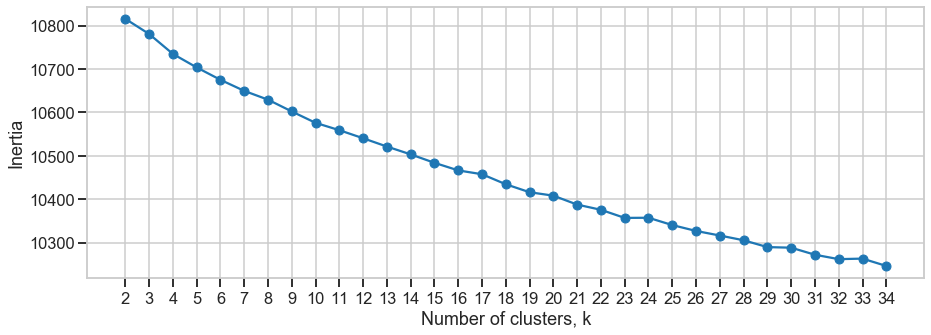

In [76]:
plt.figure(figsize=(15,5))
plt.plot(ks, inertias, '-o')
plt.xlabel('Number of clusters, k')
plt.ylabel('Inertia')
plt.xticks(ks)
plt.show()

There isn't a claer elbow, although at 13 there is a _slight_ plateau.

In [77]:
# model to assign values - going with 13 clusters
kmeans = KMeans(n_clusters=13)
y_pred = kmeans.fit_predict(tfidf_df)

Text(0, 0.5, 'Number of Reviews')

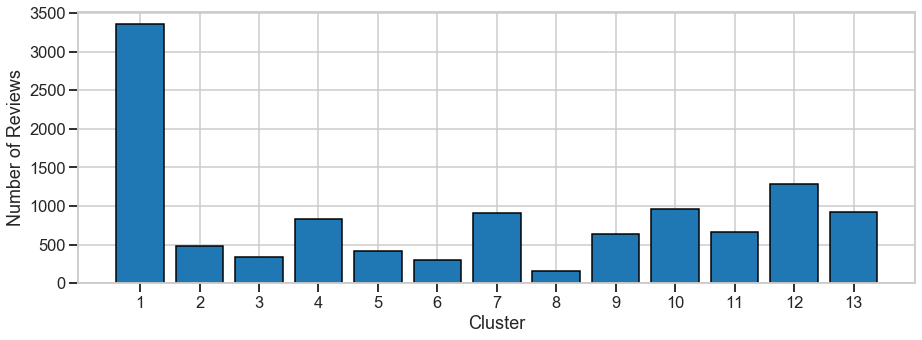

In [78]:
# add cluster assignment to the tfidf dataframe
tfidf_df['cluster'] = y_pred

plt.figure(figsize=(15,5))
plt.bar([i for i in range(1, 14)], tfidf_df['cluster'].value_counts(sort=False), ec='k')
plt.xticks([i for i in range(1, 14)])
plt.xlabel('Cluster')
plt.ylabel('Number of Reviews')

Most reviews are in the 13th cluster. Next, I've performed a PCA to visualize the clusters.

*** 
### Principal Component Analysis

I use a PCA to reduce the dimensions of the TF-IDF data and visualize the clusters on a 2-D plot.

[Return to Top: Modeling of Reviews](#Modeling-of-Reviews)

In [79]:
# pca to visualize clusters
pca = PCA(n_components=2)

# Apply the fit_transform method of model to grains: pca_features
pca_features = pca.fit_transform(tfidf_df.drop(columns='cluster'))

# some columns to append to
df_pca = tfidf_df[['cluster']]

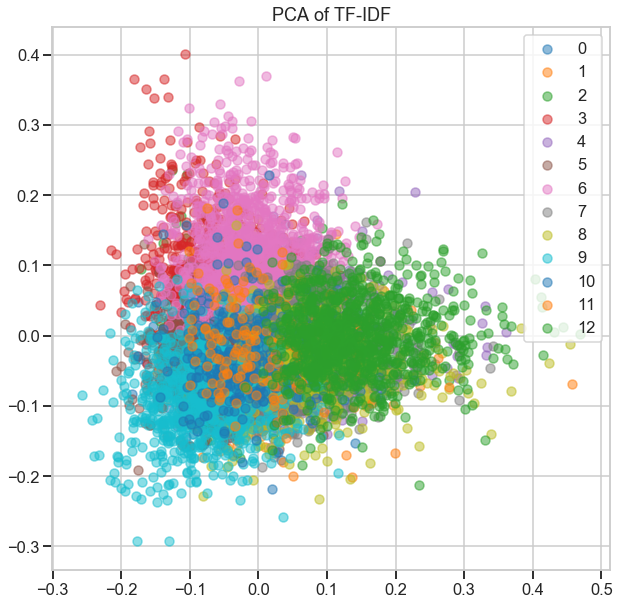

In [80]:
# Assign 0th column of pca_features: xs
df_pca['x'] = pca_features[:,0]

# Assign 1st column of pca_features: ys
df_pca['y'] = pca_features[:,1]

# Scatter plot of first and second component of PCA
plt.figure(figsize=(10,10))
for cluster in range(13):
    plt.scatter(df_pca.loc[df_pca['cluster']==cluster, 'x'], df_pca.loc[df_pca['cluster']==cluster, 'y'], label=cluster, alpha=0.5)
plt.plot()
plt.legend()
plt.title('PCA of TF-IDF')
plt.show()

In [81]:
import plotly.graph_objects as go
import numpy as np

fig = go.Figure()


for cluster in range(13):
    fig.add_trace(go.Scatter(x=df_pca.loc[df_pca['cluster']==cluster, 'x'],
                             y=df_pca.loc[df_pca['cluster']==cluster, 'y'],
                             name=cluster,
                             mode='markers'))


# Set options common to all traces with fig.update_traces
fig.update_traces(mode='markers', marker_line_width=2, marker_size=10)
fig.update_layout(title='Interactive PCA',
                  yaxis_zeroline=False, xaxis_zeroline=False)

fig.write_html('plotly_figures/interactive_pca.html')
fig.show()

Based on these visualizations, we can see how the clusters might be seperate, although there appears to be overlap. This makes sense: similar words are likely used in all restaurant reviews, such as "restaurant" or "service" and could appear in many reviews.

In [82]:
# get mean for each vector by cluster
tfidf_means = tfidf_df.groupby('cluster').mean()
top_feats = {}
for cluster in range(13):
    top_feats[cluster] = tfidf_means.iloc[cluster].sort_values(ascending=False).head(5).index.to_list()
    print('Cluster: {}'.format(cluster))
    print([feat.split('word_')[1] for feat in top_feats[cluster]])
    print('---')

Cluster: 0
['good', 'food', 'place', 'like', 'restaurant']
---
Cluster: 1
['burger', 'fry', 'good', 'great', 'place']
---
Cluster: 2
['pizza', 'good', 'crust', 'place', 'pie']
---
Cluster: 3
['order', 'food', 'delivery', 'time', 'pick']
---
Cluster: 4
['staff', 'friendly', 'food', 'great', 'good']
---
Cluster: 5
['noodle', 'soup', 'thai', 'raman', 'dumpling']
---
Cluster: 6
['wait', 'come', 'table', 'time', 'food']
---
Cluster: 7
['love', 'food', 'place', 'amazing', 'good']
---
Cluster: 8
['recommend', 'highly', 'food', 'place', 'great']
---
Cluster: 9
['chicken', 'fry', 'good', 'sandwich', 'order']
---
Cluster: 10
['taco', 'good', 'order', 'mexican', 'food']
---
Cluster: 11
['sushi', 'roll', 'good', 'fresh', 'place']
---
Cluster: 12
['great', 'food', 'service', 'good', 'place']
---


***
### Topic Modeling
Here, I use the clusters to identify terms and sentiment of terms associated with COVID-19.  

[Return to Top: Modeling of Reviews](#Modeling-of-Reviews)

In [83]:
# see which clusters seem to have the largest values for coronavirus words
coronavirus_words = ['covid', 'coronavirus', 'corona', 'covid-19', 'virus', 'pandemic', 'quarantine']
for word in coronavirus_words:
    if 'word_{}'.format(word) in tfidf_means.columns:
        max_value = tfidf_means['word_{}'.format(word)].max()
        max_cluster = tfidf_means[tfidf_means['word_{}'.format(word)]==max_value].index.to_list()

        print('"{}": Cluster {}'.format(word.capitalize(), max_cluster[0]))

"Covid": Cluster 3
"Coronavirus": Cluster 3
"Corona": Cluster 3
"Virus": Cluster 3
"Pandemic": Cluster 3
"Quarantine": Cluster 3


In [90]:
# see which clusters seem to have the largest values for random words as a sanity check
not_coronavirus_words = ['mexican', 'pasta', 'sushi', 'takeout', 'service', 'chicken', 'ambiance']
for word in not_coronavirus_words:
    if 'word_{}'.format(word) in tfidf_means.columns:
        max_value = tfidf_means['word_{}'.format(word)].max()
        max_cluster = tfidf_means[tfidf_means['word_{}'.format(word)]==max_value].index.to_list()

        print('"{}": Cluster {}'.format(word.capitalize(), max_cluster[0]))

"Mexican": Cluster 10
"Pasta": Cluster 8
"Sushi": Cluster 11
"Takeout": Cluster 3
"Service": Cluster 12
"Chicken": Cluster 9
"Ambiance": Cluster 12


Coronavirus terms appear to cluster together (the cluster number changes each time the KMeans is run, so I've printed it below). For a sanity check, I included some random terms as well in a second check to see where they might cluster. Next, I'll investigate what other words are associated with the coronavirus cluster.

In [85]:
if 'word_coronavirus' in tfidf_means.columns:
    max_value = tfidf_means['word_coronavirus'].max()
    corona_cluster = tfidf_means[tfidf_means['word_coronavirus']==max_value].index.to_list()[0]

    print('Coronavirus cluster: {}'.format(corona_cluster))

Coronavirus cluster: 3


In [86]:
print('Top terms associated with COVID-19-like Terms:')
print([feat.split('word_')[1] for feat in tfidf_means.iloc[corona_cluster].sort_values(ascending=False).head(50).index.to_list()])

Top terms associated with COVID-19-like Terms:
['order', 'food', 'delivery', 'time', 'pick', 'restaurant', 'place', 'delicious', 'come', 'good', 'try', 'support', 'takeout', 'deliver', 'want', 'eat', 'wait', 'great', 'business', 'thank', 'like', 'service', 'minute', 'meal', 'customer', 'tell', 'phone', 'covid', 'home', 'local', 'ask', 'online', 'right', 'rice', 'open', 'ready', 'pickup', 'definitely', 'people', 'chicken', 'amazing', 'know', 'amp', 'dinner', 'sauce', 'salad', 'portion', 'menu', 'price', 'today']


In [91]:
## examine reviews from the corona cluster
# join tfidf to df_short
df_join = df_short.merge(tfidf_df, left_index=True, right_index=True)

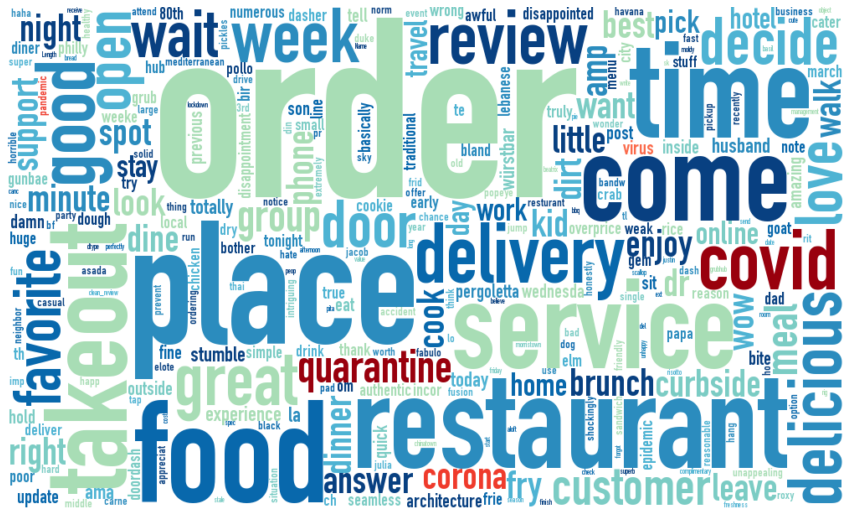

In [92]:
# wordcloud of corona cluster
font_path = '/System/Library/Fonts/Supplemental/DIN Condensed Bold.ttf'
from palettable.colorbrewer.sequential import GnBu_9, Reds_8
def color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    if word in coronavirus_words:
        return tuple(Reds_8.colors[random.randint(3,7)])
    return tuple(GnBu_9.colors[random.randint(3,8)])

wc = WordCloud(font_path=font_path, 
               background_color="white", 
               width=1000, 
               height=600,
               max_words=500,
               max_font_size=300, 
               random_state=42)

plt.figure(figsize=(15,15))

wc.generate(str(df_join.loc[df_join['cluster']==corona_cluster, 'clean_review']))
wc.recolor(color_func=color_func, random_state=3)

wc.to_file('covid_wordcloud.png')

plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

***
### Coronavirus-Like Review Sentiment
Now that I've identified a cluster of reviews that associate with coronavirus-like terms, I look at the sentiment of these reviews compared to others.  
- [Sentiment of the Coronavirus Cluster](#Sentiment-of-the-Coronavirus-Cluster)    
- [Comparison of Sentiment by Cluster](#Comparison-of-Sentiment-by-Cluster)  
- [Sample Reviews for the Coronavirus-Like Cluster](#Sample-Reviews-for-the-Coronavirus-Like-Cluster)  
- [Geographical Distribution of Coronavirus-Like Reviews](#Geographical-Distribution-of-Coronavirus-Like-Reviews)  

[Return to Top: Modeling of Reviews](#Modeling-of-Reviews)

#### Sentiment of the Coronavirus Cluster
Next, I examined how review sentiment was associated with the coronavirus cluster compared to all clusters.

In [93]:
# examine range of VADER scores and review scores
print('Coronavirus Cluster Statistics:')
print('Compound VADER scores:')
print('Mean: {:.4f}'.format(df_join.loc[df_join['cluster']==corona_cluster, 'compound'].mean()))
print('Low: {}; High: {}'.format(df_join.loc[df_join['cluster']==corona_cluster, 'compound'].min(), df_join.loc[df_join['cluster']==corona_cluster, 'compound'].max()))
print('---')
print('Positive VADER scores:')
print('Mean: {:.4f}'.format(df_join.loc[df_join['cluster']==corona_cluster, 'pos'].mean()))
print('Low: {}; High: {}'.format(df_join.loc[df_join['cluster']==corona_cluster, 'pos'].min(), df_join.loc[df_join['cluster']==corona_cluster, 'pos'].max()))
print('---')
print('Negative VADER scores:')
print('Mean: {:.4f}'.format(df_join.loc[df_join['cluster']==corona_cluster, 'neg'].mean()))
print('Low: {}; High: {}'.format(df_join.loc[df_join['cluster']==corona_cluster, 'neg'].min(), df_join.loc[df_join['cluster']==corona_cluster, 'neg'].max()))
print('\n---')
print('Overall Statistics:')
print('Compound VADER scores:')
print('Mean: {:.4f}'.format(df_join['compound'].mean()))
print('Low: {}; High: {}'.format(df_join['compound'].min(), df_join['compound'].max()))
print('---')
print('Positive VADER scores:')
print('Mean: {:.4f}'.format(df_join['pos'].mean()))
print('Low: {}; High: {}'.format(df_join['pos'].min(), df_join['pos'].max()))
print('---')
print('Negative VADER scores:')
print('Mean: {:.4f}'.format(df_join['neg'].mean()))
print('Low: {}; High: {:.4f}'.format(df_join['neg'].min(), df_join['neg'].max()))
print('\n---')

Coronavirus Cluster Statistics:
Compound VADER scores:
Mean: 0.5703
Low: -0.9866; High: 0.9987
---
Positive VADER scores:
Mean: 0.2844
Low: 0.0; High: 0.765
---
Negative VADER scores:
Mean: 0.0866
Low: 0.0; High: 0.495

---
Overall Statistics:
Compound VADER scores:
Mean: 0.7883
Low: -0.9866; High: 0.9992
---
Positive VADER scores:
Mean: 0.3812
Low: 0.0; High: 0.872
---
Negative VADER scores:
Mean: 0.0558
Low: 0.0; High: 0.6890

---


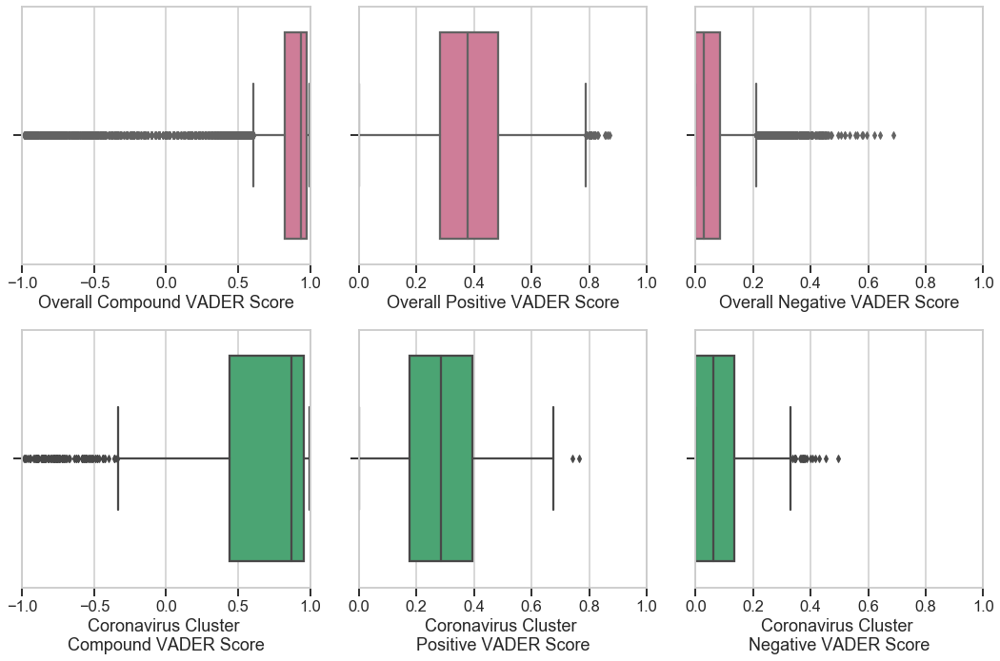

In [94]:
# VADER scores for cluster corona_cluster v all other clusters
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

sns.boxplot(df_join['compound'], color='palevioletred', ax=axes[0,0])
sns.boxplot(df_join['pos'], color='palevioletred', ax=axes[0,1])
sns.boxplot(df_join['neg'], color='palevioletred', ax=axes[0,2])

axes[0,0].set_xlabel('Overall Compound VADER Score')
axes[0,1].set_xlabel('Overall Positive VADER Score')
axes[0,2].set_xlabel('Overall Negative VADER Score')

sns.boxplot(df_join.loc[df_join['cluster']==corona_cluster, 'compound'], color='mediumseagreen', ax=axes[1,0])
sns.boxplot(df_join.loc[df_join['cluster']==corona_cluster, 'pos'], color='mediumseagreen', ax=axes[1,1])
sns.boxplot(df_join.loc[df_join['cluster']==corona_cluster, 'neg'], color='mediumseagreen', ax=axes[1,2])

axes[1,0].set_xlabel('Coronavirus Cluster \nCompound VADER Score')
axes[1,1].set_xlabel('Coronavirus Cluster \nPositive VADER Score')
axes[1,2].set_xlabel('Coronavirus Cluster \nNegative VADER Score')

# same axes - compound ranges -1 to 1; pos and neg range 0 to 1
axes[0,0].set_xlim(-1,1)
axes[1,0].set_xlim(-1,1)
axes[0,1].set_xlim(0,1)
axes[1,1].set_xlim(0,1)
axes[0,2].set_xlim(0,1)
axes[1,2].set_xlim(0,1)

plt.tight_layout()

In [95]:
# test for significant differences between cluster corona_cluster and all data
# compare compound VADER score 
mean_diff, conf_int, p_low, p_high = bootstrap(df_join['compound'], df_join.loc[df_join['cluster']==corona_cluster, 'compound'])
if p_low < 0.05:
    print('The compound VADER score significantly decreased by a mean difference of {:.3f}; p={}'.format(np.abs(mean_diff), p_low))
elif p_high <0.05:    
    print('The compound VADER score significantly increased by a mean difference of {:.3f}; p={}'.format(np.abs(mean_diff), p_high))
else:
    print('No significant change in compound VADER score; p={}'.format(p_low))
    
# compare pos VADER score
mean_diff, conf_int, p_low, p_high = bootstrap(df_join['pos'], df_join.loc[df_join['cluster']==corona_cluster, 'pos'])
if p_low < 0.05:
    print('The positive VADER score significantly decreased by a mean difference of {:.3f}; p={}'.format(np.abs(mean_diff), p_low))
elif p_high <0.05:    
    print('The positive VADER score significantly increased by a mean difference of {:.3f}; p={}'.format(np.abs(mean_diff), p_high))
else:
    print('No significant change in positive VADER score; p={}'.format(p_low))
    
# compare neg VADER score 
mean_diff, conf_int, p_low, p_high = bootstrap(df_join['neg'], df_join.loc[df_join['cluster']==corona_cluster, 'neg'])
if p_low < 0.05:
    print('The negative VADER score significantly decreased by a mean difference of {:.3f}; p={}'.format(np.abs(mean_diff), p_low))
elif p_high <0.05:    
    print('The negative VADER score significantly increased by a mean difference of {:.3f}; p={}'.format(np.abs(mean_diff), p_high))
else:
    print('No significant change in negative VADER score; p={}'.format(p_low))

The compound VADER score significantly decreased by a mean difference of 0.218; p=0.0
The positive VADER score significantly decreased by a mean difference of 0.097; p=0.0
The negative VADER score significantly increased by a mean difference of 0.031; p=0.0


In the coronavirus cluster, we see a significant decrease in positive sentiment, increase in negative sentiment and decrease in compound (overall) sentment compared to the whole group. We can confirm that VADER got it right using the scores left by reviewers (review stars).

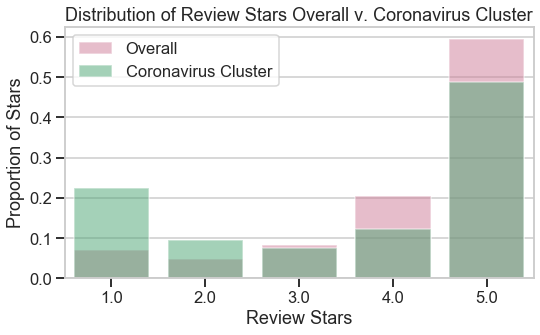

In [96]:
plt.figure(figsize=(8,5))

sns.barplot(df_join['score'].value_counts(normalize=True).sort_index().index,
            df_join['score'].value_counts(normalize=True).sort_index(),
            alpha=0.5, color='palevioletred', label='Overall')
sns.barplot(df_join.loc[df_join['cluster']==corona_cluster, 'score'].value_counts(normalize=True).sort_index().index,
            df_join.loc[df_join['cluster']==corona_cluster, 'score'].value_counts(normalize=True).sort_index(),
            alpha=0.5, color='mediumseagreen', label='Coronavirus Cluster')
plt.title('Distribution of Review Stars Overall v. Coronavirus Cluster')
plt.xlabel('Review Stars')
plt.ylabel('Proportion of Stars')
plt.legend()
plt.tight_layout()
plt.savefig('corona_cluster_review_stars.jpg', dpi=500)

Here, we see an increase in the proportion of 1-star reviews in the coronavirus cluster and a decrease in 4- and 5-star reviews.

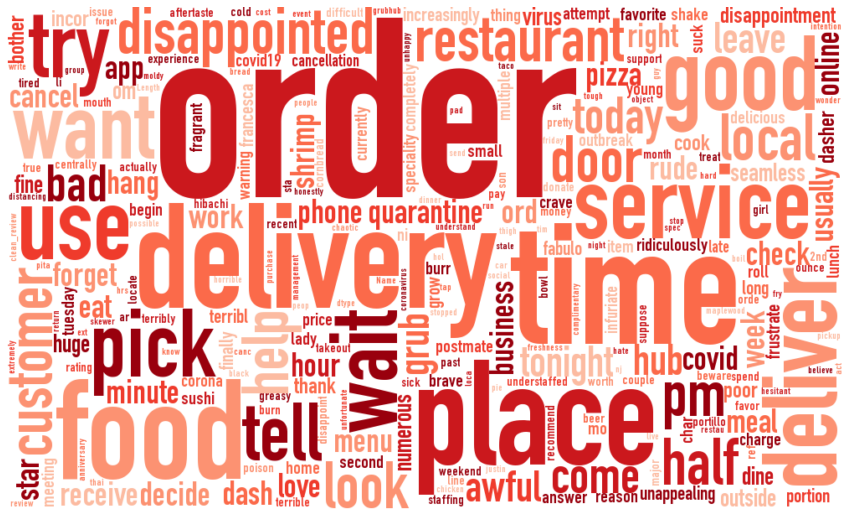

In [97]:
# 1-star review corona cluster wordcloud
font_path = '/System/Library/Fonts/Supplemental/DIN Condensed Bold.ttf'
def color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return tuple(Reds_8.colors[random.randint(2,7)])

wc = WordCloud(font_path=font_path, 
               background_color="white", 
               width=1000, 
               height=600,
               max_words=500,
               max_font_size=300, 
               random_state=42)

plt.figure(figsize=(15,15))

wc.generate(str(df_join.loc[(df_join['cluster']==corona_cluster) &
                            (df_join['score']==1), 'clean_review']))
wc.recolor(color_func=color_func, random_state=3)

wc.to_file('1_star_covid_wordcloud.png')
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

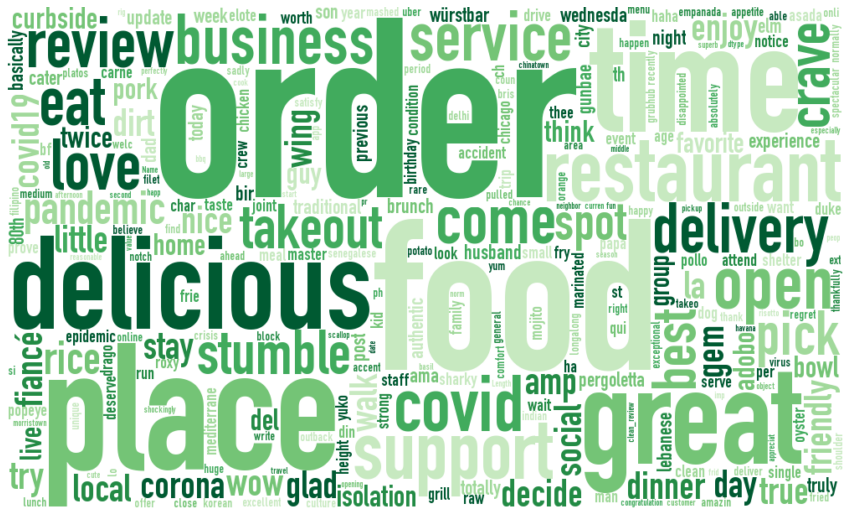

In [98]:
# 5 star corona cluster review wordcloud
font_path = '/System/Library/Fonts/Supplemental/DIN Condensed Bold.ttf'
from palettable.colorbrewer.sequential import Greens_8
def color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return tuple(Greens_8.colors[random.randint(2,7)])

wc = WordCloud(font_path=font_path, 
               background_color="white", 
               width=1000, 
               height=600,
               max_words=500,
               max_font_size=300, 
               random_state=42)

plt.figure(figsize=(15,15))

wc.generate(str(df_join.loc[(df_join['cluster']==corona_cluster) &
                            (df_join['score']==5), 'clean_review']))
wc.recolor(color_func=color_func, random_state=3)

wc.to_file('5_star_covid_wordcloud.png')
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

#### Comparison of Sentiment by Cluster
I compare the sentiment of the coronavirus-like cluster to all individual clusters.

[Return to Top: Coronavirus-Like Review Sentiment](#Coronavirus-Like-Review-Sentiment)

In [99]:
colors = ['mediumseagreen' if i==corona_cluster else 'palevioletred' for i in range(13)]
cluster_palette = dict(zip(range(13), colors))

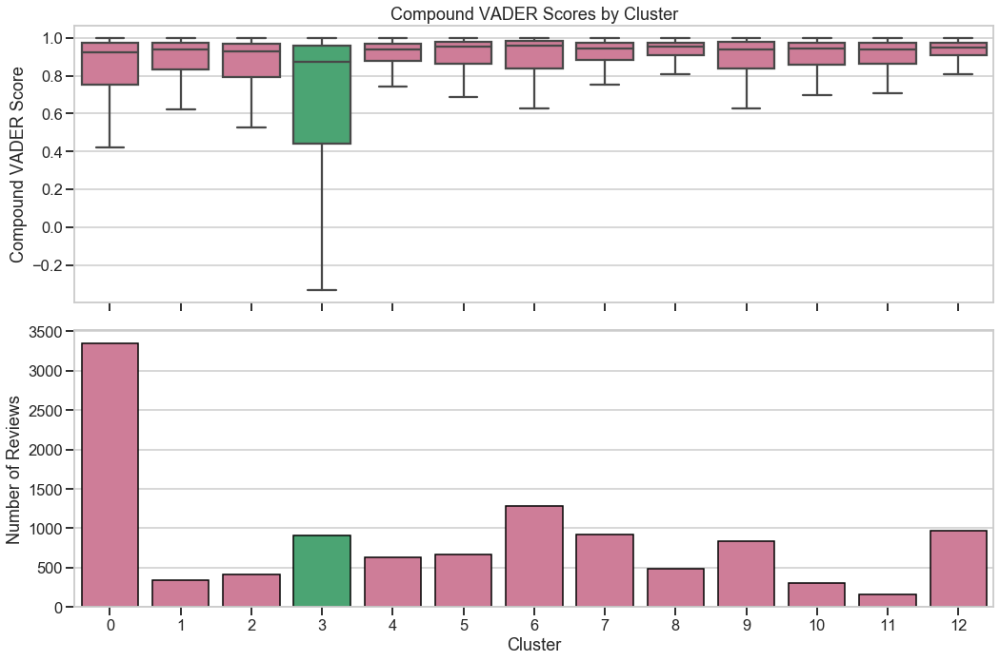

In [100]:
cluster_compound_vol = df_join.groupby('cluster').count()['compound']

fig, axs = plt.subplots(2, figsize=(15,10), sharex=True)
sns.boxplot(x='cluster', y='compound', data=df_join, 
            showfliers=False, ax=axs[0], palette=cluster_palette)
sns.barplot(x=cluster_compound_vol.index, y=cluster_compound_vol, 
            ax=axs[1], ec='k', palette=cluster_palette)

axs[0].set_title('Compound VADER Scores by Cluster')
axs[0].set_xlabel('')
axs[0].set_ylabel('Compound VADER Score')
axs[1].set_xlabel('Cluster')
axs[1].set_ylabel('Number of Reviews')

plt.savefig('corona_cluster_compound_vader.jpg', dpi=500)
plt.tight_layout()

In [101]:
cluster_compound_bootstrap = bootstrap_all(df_join['cluster'].unique(), df_join, 'cluster', 'compound')

In [102]:
cluster_compound_bootstrap[cluster_compound_bootstrap['p-value_low']<0.05].sort_values('Mean', ascending=False)

,Variable,Mean,Mean of Others,Mean Difference,95% CI,p-value_high,p-value_low
11,6,0.768914,0.790841,-0.021927,"[-0.04840749345933512, 0.0032481048567610167]",0.9503,0.0497
6,0,0.735348,0.810777,-0.075429,"[-0.09269807241195972, -0.05879886757125972]",1.0000,0.0000
8,3,0.570321,0.807377,-0.237057,"[-0.27572792773638477, -0.198095595008483]",1.0000,0.0000


We can see that the coronavirus cluster (colored in green) has a significantly lower compound VADER score than the other clusters; not only is this difference significant, but it's extreme, with a drop of ~0.24.

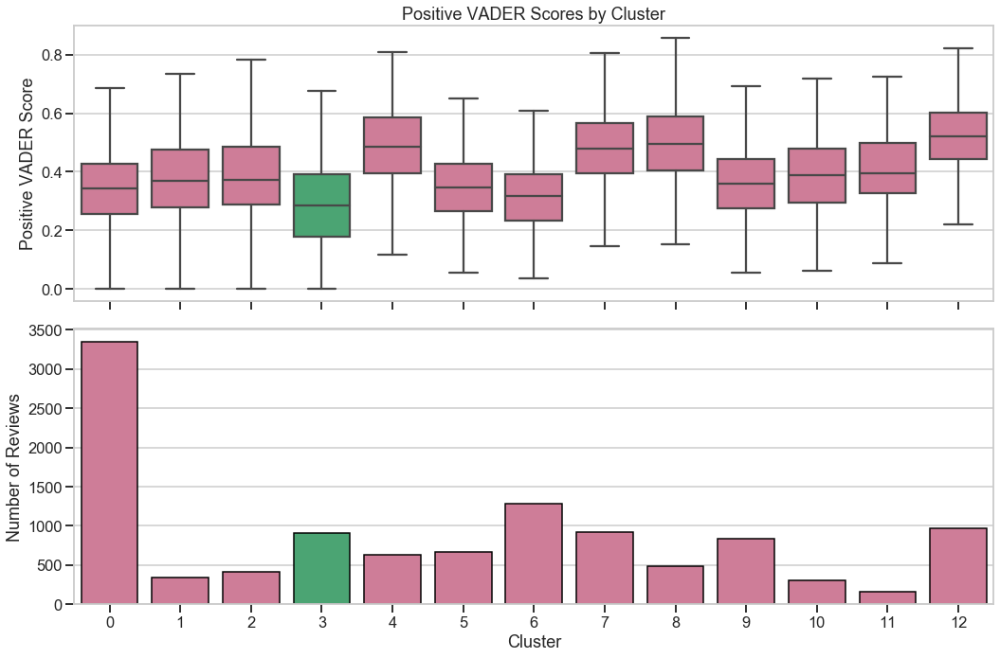

In [103]:
cluster_compound_vol = df_join.groupby('cluster').count()['pos']

fig, axs = plt.subplots(2, figsize=(15,10), sharex=True)
sns.boxplot(x='cluster', y='pos', data=df_join, 
            showfliers=False, ax=axs[0], palette=cluster_palette)
sns.barplot(x=cluster_compound_vol.index, y=cluster_compound_vol, 
            ax=axs[1], ec='k', palette=cluster_palette)

axs[0].set_title('Positive VADER Scores by Cluster')
axs[0].set_xlabel('')
axs[0].set_ylabel('Positive VADER Score')
axs[1].set_xlabel('Cluster')
axs[1].set_ylabel('Number of Reviews')

plt.savefig('corona_cluster_pos_vader.jpg', dpi=500)
plt.tight_layout()

In [104]:
cluster_pos_bootstrap = bootstrap_all(df_join['cluster'].unique(), df_join, 'cluster', 'pos')

In [105]:
cluster_pos_bootstrap[cluster_pos_bootstrap['p-value_low']<0.05].sort_values('Mean', ascending=False)

,Variable,Mean,Mean of Others,Mean Difference,95% CI,p-value_high,p-value_low
1,9,0.358224,0.383031,-0.024807,"[-0.03440399241927935, -0.015356211757273303]",1.0,0.0
4,5,0.348563,0.383247,-0.034684,"[-0.04475145625533093, -0.024522258276104703]",1.0,0.0
6,0,0.343410,0.397200,-0.053790,"[-0.05965073812392859, -0.04789274822962352]",1.0,0.0
11,6,0.312390,0.390070,-0.077680,"[-0.08477799303346391, -0.07039984300380092]",1.0,0.0
8,3,0.284360,0.389655,-0.105294,"[-0.11523236903912609, -0.09562735946312548]",1.0,0.0


Again, we see that the coronavirus-like cluster has a significantly lower positive VADER score than the other clusters.

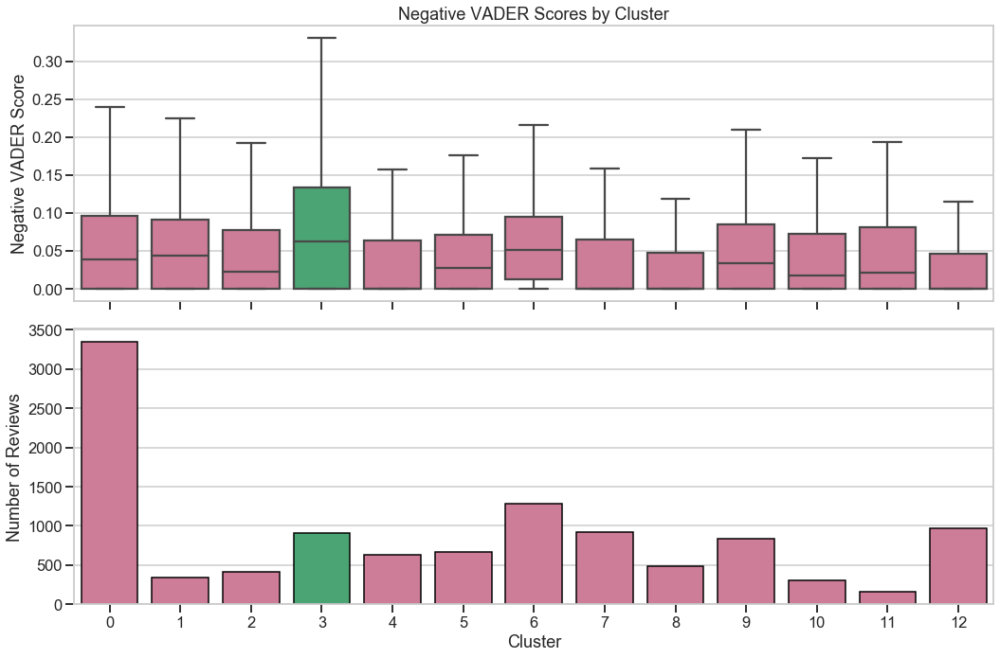

In [106]:
cluster_compound_vol = df_join.groupby('cluster').count()['neg']

fig, axs = plt.subplots(2, figsize=(15,10), sharex=True)
sns.boxplot(x='cluster', y='neg', data=df_join, 
            showfliers=False, ax=axs[0], palette=cluster_palette)
sns.barplot(x=cluster_compound_vol.index, y=cluster_compound_vol, 
            ax=axs[1], ec='k', palette=cluster_palette)

axs[0].set_title('Negative VADER Scores by Cluster')
axs[0].set_xlabel('')
axs[0].set_ylabel('Negative VADER Score')
axs[1].set_xlabel('Cluster')
axs[1].set_ylabel('Number of Reviews')

plt.tight_layout()

In [107]:
cluster_neg_bootstrap = bootstrap_all(df_join['cluster'].unique(), df_join, 'cluster', 'neg')

In [108]:
cluster_neg_bootstrap[cluster_neg_bootstrap['p-value_high']<0.05].sort_values('Mean', ascending=False)

,Variable,Mean,Mean of Others,Mean Difference,95% CI,p-value_high,p-value_low
8,3,0.086582,0.053060,0.033523,"[0.027462615194596487, 0.03980274963183582]",0.0000,1.0000
11,6,0.067091,0.054290,0.012801,"[0.008693571527281441, 0.016965500965022494]",0.0000,1.0000
6,0,0.066121,0.051361,0.014759,"[0.011487738505179581, 0.018037385036719197]",0.0000,1.0000
9,1,0.065238,0.055457,0.009781,"[0.000981606120026473, 0.018856122839270236]",0.0186,0.9814


Here, we see that the coronavirus-like cluster has a significantly higher negative VADER score than the other clusters.

#### Sample Reviews for the Coronavirus-Like Cluster

[Return to Top: Coronavirus-Like Review Sentiment](#Coronavirus-Like-Review-Sentiment)

In [109]:
# 5 reviews with lowest compound scores in coronavirus cluster
# the first time i ran this, it was cluster 12, so thats where all the 12s are coming from
# create list of reviews listed so we can exclude them easily later
first_neg_reviews = []
for idx, row in df_join[(df_join['cluster']==corona_cluster)].sort_values('compound').head(5).iterrows():
    first_neg_reviews.append(idx)
    print('\n---City: {}---'.format(row['city_x']))
    print('Restaurant Name: {}'.format(row['name']))
    print('Review Score: {}'.format(row['score']))
    print('Review Date: {}\n'.format(row['publish_date']))
    print(row['description'])


---City: Passaic, New Jersey---
Restaurant Name: The Cheesecake Factory
Review Score: 1.0
Review Date: 2020-04-18 00:00:00

Normally cheesecake is fine besides them forgetting cake or items on pick up which has been an issue but today is different. I placed an order online for curbside pickup, when you go onto the site it says something along the lines of "all orders will be curbside pick up and you will be texted when your order is ready" So I place my order and the message on my order as well as in email form says come inside to bakery counter, upon several calls to clarify during the pandemic no one answered as per their usual unprofessionalism/poor customer service, after a while I got a fax machine sound so I hung up. Upon arriving to a load of cars I go inside to way too many people probably also confused to what to do. I wait in a long line to get to the front and after 20 minutes they tell me they can't find the order, I tell them what it is and they have no recollection and t

Several of the negative reviews do not explicitly mention COVID-19 and could likely be from before those restaurants switched business strategies; however, several of the others have consistent themes mentioning price, food quality, and service.

In [110]:
# 5 reviews with highest compound scores overall
first_pos_reviews = []
for idx, row in df_join[(df_join['cluster']==corona_cluster)].sort_values('compound', ascending=False).head(5).iterrows():
    first_pos_reviews.append(idx)
    print('\n---City: {}---'.format(row['city_x']))
    print('Restaurant Name: {}'.format(row['name']))
    print('Review Score: {}'.format(row['score']))
    print('Review Date: {}\n'.format(row['publish_date']))
    print(row['description'])


---City: Macomb, Michigan---
Restaurant Name: P.F. Chang's
Review Score: 4.0
Review Date: 2020-04-13 00:00:00

I was excited weeks ago to participate with "Yelp's Big Night-In" Event on April 11.  Thanks to our Yelp coordinator, Annette J and others it was the perfect way of "Not Cooking" on a Saturday night.  What a great idea to help support any local business in my area that was open for carryout or delivery due to the pandemic COVID-19.  
* FYI: I always like to enjoy 3 of my favorite Chinese food places yet only this one is currently Open. The other 2 are temporarily closed so I decided to go with PF. 

So here's my "Dine-In" Review:
I decided on P.F. Chang's due to my craving for Chinese and also to help and assist this well-known local business on M-59 (Hall Rd) near Partridge Creek Mall. Instead of my phone app I found it quicker and easy to place my order online with my laptop so to view their easy menu options.  Also the website for P.F. Chang's was already set up with an ar

Several of the top positive reviews appear to be from prior to lockdown. Just as an aside, I would guess review length is almost definitely associated with review sentiment - at the very least, short reviews are more likely to be neutral, but it seems the positive reviews are very long.

Here, I look again at both negative and positive reviews, but only those left since April 1, 2020. I've excluded reviews we've already seen.

In [111]:
newest_reviews = df_join[(df_join['publish_date']>'2020-04-01') & (~df_join.index.isin(first_neg_reviews))]
# 10 reviews with highest compound scores in cluster 12 since April 1
for idx, row in newest_reviews[(newest_reviews['cluster']==corona_cluster)].sort_values('compound').head(5).iterrows():
    print('\n---City: {}---'.format(row['city_x']))
    print('Restaurant Name: {}'.format(row['name']))
    print('Review Score: {}'.format(row['score']))
    print('Review Date: {}\n'.format(row['publish_date']))
    print(row['description'])


---City: Essex, New Jersey---
Restaurant Name: Cuban Pete's
Review Score: 1.0
Review Date: 2020-04-18 00:00:00

What horrible management! First time I ordered from here (on seamless) and it took almost two hrs! My order totaled almost $100 I understand the hardship right now with  the virus and everything happening which is why I wasn't rude but when I called to see what the issue was the person didn't even ask for my name to see how much longer my order would be. He was so nasty and just told me the driver needs to come in to get the food(when she already called me and told me she went in twice) when I called back to ask after the third time the driver went in the guy said the driver just went out "good luck" ....what the hell does that even mean! I will never order from here again. Fine the food took two hrs no prob but the guy with his rudeness was unacceptable.

---City: New Haven, Connecticut---
Restaurant Name: Hook & Reel Cajun Seafood & Bar
Review Score: 2.0
Review Date: 2020-

In [112]:
newest_reviews = df_join[(df_join['publish_date']>'2020-04-01') & (~df_join.index.isin(first_pos_reviews))]
# 10 reviews with highest compound scores in cluster 12 since April 1
for idx, row in newest_reviews[(newest_reviews['cluster']==corona_cluster)].sort_values('compound', ascending=False).head(5).iterrows():
    print('\n---City: {}---'.format(row['city_x']))
    print('Restaurant Name: {}'.format(row['name']))
    print('Review Score: {}'.format(row['score']))
    print('Review Date: {}\n'.format(row['publish_date']))
    print(row['description'])


---City: Passaic, New Jersey---
Restaurant Name: Cumin N Eat
Review Score: 5.0
Review Date: 2020-04-11 00:00:00

We have been looking for a good Indian restaurant in our area. Welcome to Secaucus! Thank you so much for being open at this time and for your delicious food and your quick delivery. We had a lamb appetizer , vegetable korma, vegetable biryani, and aloo gobi- cauliflower dishes.  Wow!!
There's nothing like the robust spice of the Indian cuisine.  My palette is still alive with wonderful spicing. 

The lamb was perfectly stewed and spiced and was tender and moist.  We found the sauce of the vegetable korma slightly too thick and a smaller portion by comparison to the other entree but enjoy the taste very much.  The rice dish was alive with a cacophony of spices !! Wow!!  It was the most flavorful and my favorite dish.  The cauliflower was gifted to us as was some raita and a ginger sweet carrot desert.  That was very kind.    The spice and heat on the cauliflower was perfect

#### Geographical Distribution of Coronavirus-Like Reviews
To look at city by cluster, below, I show the proportions of reviews by city (normalized) overall and by the coronavirus cluster. 

[Return to Top: Coronavirus-Like Review Sentiment](#Coronavirus-Like-Review-Sentiment)

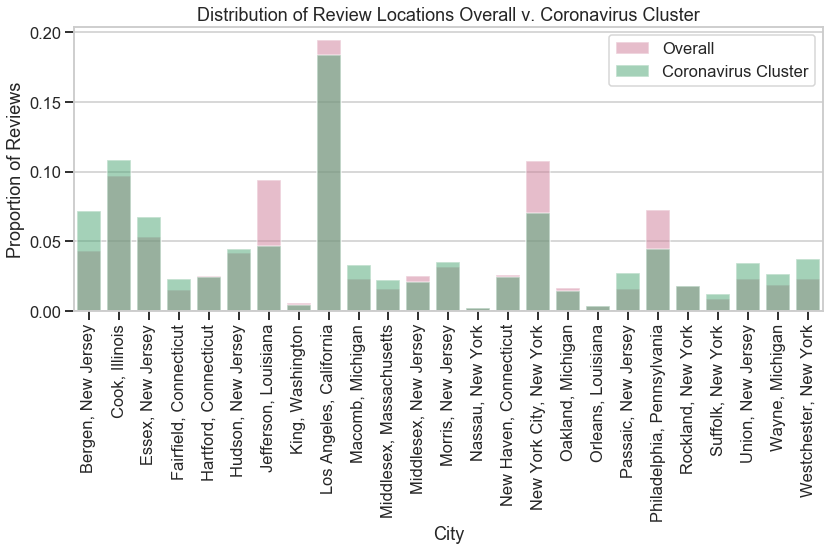

In [113]:
plt.figure(figsize=(12,8))

sns.barplot(df_join['city_x'].value_counts(normalize=True).sort_index().index,
            df_join['city_x'].value_counts(normalize=True).sort_index(),
            alpha=0.5, color='palevioletred', label='Overall')
sns.barplot(df_join.loc[df_join['cluster']==corona_cluster, 'city_x'].value_counts(normalize=True).sort_index().index,
            df_join.loc[df_join['cluster']==corona_cluster, 'city_x'].value_counts(normalize=True).sort_index(),
            alpha=0.5, color='mediumseagreen', label='Coronavirus Cluster')
plt.title('Distribution of Review Locations Overall v. Coronavirus Cluster')
plt.xlabel('City')
plt.ylabel('Proportion of Reviews')
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()

It appears that COVID-19-like reviews are less likely to come from Jefferson, LA (New Orleans); NYC; New Haven; and Philadelphia. I hypothesize that this decrease may be due to higher impacts of COVID-19 in particularly dense areas, especially in NYC, where take-out may be less of an option than in more suburban areas.

***
### Modeling Conclusions

Using clustering, we're able to see that coronavirus-like terms do cluster together, along with terms such as "order", "time", "delivery", "support", "takeout", "service", and even "online" - which makes sense, given the drastically changed business model restaurants across the U.S. have been forced to adopt since early March. 

This cluster has significantly _worse_ sentiment than the other clusters, which I thought initially could be due to words like "pandemic" being classified as negative words by VADER; however, I confirmed lower sentmeint using review stars. Of note, this cluster is easily identified as having lower sentiment visually using a boxplot - the compound VADER score is substantially lower than that of other clusters.

Geographically, reviews that cluster with coronavirus-like terms seem to come from counties across the country, but less so from some of the regions most impacted, such as NYC.

[Return to Top: Modeling of Reviews](#Modeling-of-Reviews)

## Future Directions

To expand and improve this analysis, I would do the following in the future:  
- Rescrape Yelp data to include the remainder of April to current. The current dataset was scraped in mid-April and does not span more recent weeks.
- Use cloud computing resources to run KMeans clustering on all available data

[Return to Contents](#Contents)